In [1]:
import matplotlib
from matplotlib import pylab
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.dpi'] = 80
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (6, 4),
         'axes.labelsize': 'xx-large',
         'axes.titlesize': 'xx-large',
         'xtick.labelsize': 'x-large',
         'ytick.labelsize': 'x-large',
         'figure.facecolor': 'w'}
pylab.rcParams.update(params)
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec

import h5py
import numpy as np
import os
import sys
from scipy.optimize import curve_fit

%load_ext autoreload
%autoreload 2
sys.path.insert(1, '../code')
from geometric_features import GeometricFeaturizer, geo_name
from scalar_features import ScalarFeaturizer, scalar_name
from read_halos import SimulationReader
from fit import LinearFitter
from neural_net import NeuralNet, NNFitter
import plotter
import utils
import feature_importance

In [2]:
# sim / halo info
base_dir = '/scratch/ksf293/equivariant-cosmology/data'
snap_num_str = '099' # z = 0
sim_name = 'TNG100-1'
sim_name_dark = 'TNG100-1-Dark'
# sim_name = 'TNG50-4'
# sim_name_dark = 'TNG50-4-Dark'
halo_dir = f'../data/halos/halos_{sim_name}'
halo_tag = '_nstarpartmin50_twin'
fn_dark_halo_arr = f'{halo_dir}/halos_{sim_name}{halo_tag}.npy'
mass_multiplier = 1e10
log_mass_shift = 10

In [3]:
# geo info
geo_dir = f'../data/geometric_features/geometric_features_{sim_name}'
geo_tag = '_xminPEsub_rall'
fn_geo_features = f'{geo_dir}/geometric_features{halo_tag}{geo_tag}.npy'
print(fn_geo_features)

../data/geometric_features/geometric_features_TNG100-1/geometric_features_nstarpartmin50_twin_xminPEsub_rall.npy


In [4]:
geo_featurizer = GeometricFeaturizer()
geo_featurizer.load_features(fn_geo_features)

In [5]:
n_groups = [[0,1,2], [3,4,5,6,7], [8,9,10]]
geo_feature_arr_rebinned = utils.rebin_geometric_features(geo_featurizer.geo_feature_arr, n_groups)
geo_feature_arr_pseudo = utils.transform_pseudotensors(geo_feature_arr_rebinned)

In [6]:
sim_reader = SimulationReader(base_dir, sim_name, sim_name_dark, snap_num_str)
sim_reader.load_dark_halo_arr(fn_dark_halo_arr)
sim_reader.read_simulations()

In [7]:
sim_reader.add_catalog_property_to_halos('mass_hydro_subhalo_star')
sim_reader.add_catalog_property_to_halos('m200m')
sim_reader.add_catalog_property_to_halos('r200m')
sim_reader.add_catalog_property_to_halos('v200m')

sim_reader.add_catalog_property_to_halos('x_minPE')
sim_reader.add_catalog_property_to_halos('x_minPE_hydro')

In [8]:
m_stellar = np.array([dark_halo.catalog_properties['mass_hydro_subhalo_star'] for dark_halo in sim_reader.dark_halo_arr])
m_200m = np.array([dark_halo.catalog_properties['m200m'] for dark_halo in sim_reader.dark_halo_arr])
r_200m = np.array([dark_halo.catalog_properties['r200m'] for dark_halo in sim_reader.dark_halo_arr])
v_200m = np.array([dark_halo.catalog_properties['v200m'] for dark_halo in sim_reader.dark_halo_arr])
log_m_stellar = np.log10(m_stellar)
log_m_200m = np.log10(m_200m)
log_r_200m = np.log10(r_200m)
N_halos = len(sim_reader.dark_halo_arr)
print('N_halos:', N_halos)

N_halos: 19810


In [9]:
sim_reader.add_catalog_property_to_halos('radius_hydro_subhalo_star')
r_stellar = np.array([dark_halo.catalog_properties['radius_hydro_subhalo_star'] for dark_halo in sim_reader.dark_halo_arr])
log_r_stellar = np.log10(r_stellar)

0.24890015 88.33855


Text(0, 0.5, 'count')

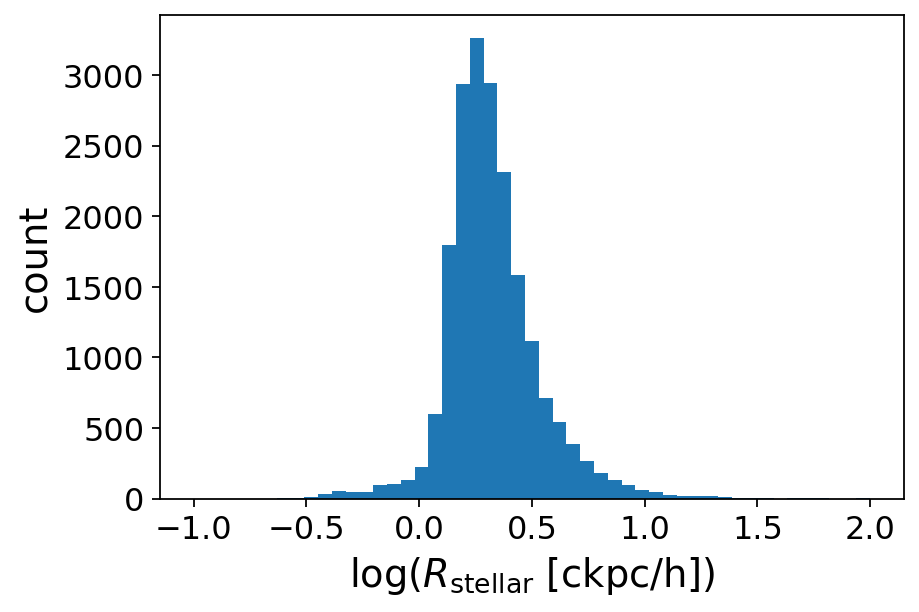

In [10]:
y_label=r'log($R_\mathrm{stellar}$ [ckpc/h])'
print(np.min(r_stellar), np.max(r_stellar))
bins = np.linspace(-1, 2)
_ = plt.hist(log_r_stellar, bins=bins)
plt.xlabel(y_label)
plt.ylabel('count')

In [11]:
sim_reader.add_catalog_property_to_halos('subhalo_hydro_flag')
subhalo_flags = np.array([dark_halo.catalog_properties['subhalo_hydro_flag'] for dark_halo in sim_reader.dark_halo_arr])

In [12]:
idx_goodflag = np.where(subhalo_flags==1)[0]
idx_badflag = np.where(subhalo_flags==0)[0]
print(len(idx_goodflag))
print(len(idx_badflag))

19802
8


Text(0, 0.5, 'log($r_\\mathrm{stellar} \\: [h^{-1} \\, \\mathrm{kpc}]$)')

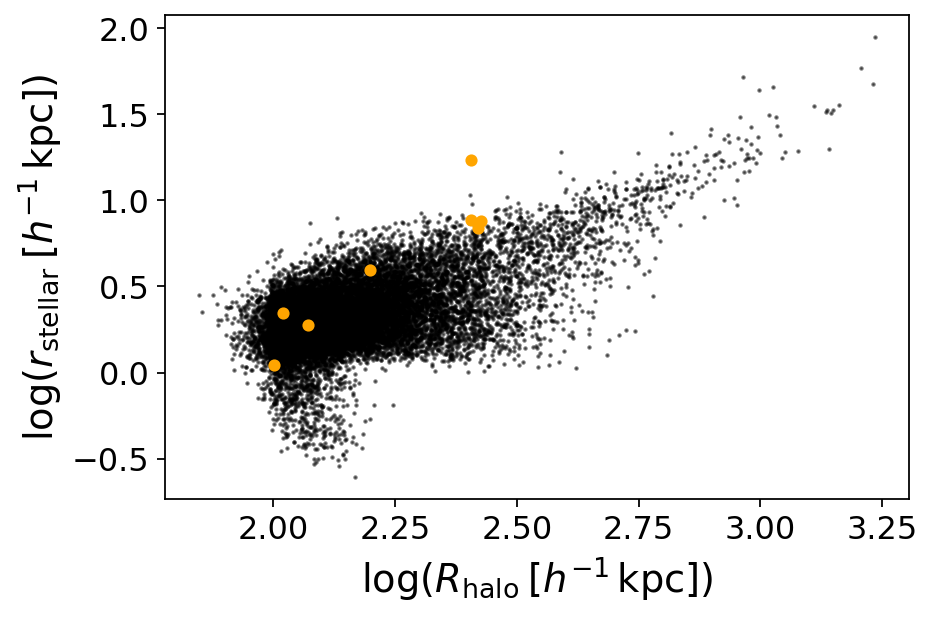

In [13]:
plt.scatter(log_r_200m[idx_goodflag], log_r_stellar[idx_goodflag], s=1, c='k', alpha=0.5)
plt.scatter(log_r_200m[idx_badflag], log_r_stellar[idx_badflag], s=20, c='orange', alpha=1)

y_label_name = 'r_stellar'
x_label_name = 'r_200m'
plt.xlabel(utils.label_dict[x_label_name])
plt.ylabel(utils.label_dict[y_label_name])

## Set up general scalar featurizer

In [14]:
# scalar info
scalar_featurizer = ScalarFeaturizer(geo_feature_arr_pseudo)
scalar_featurizer.rescale_geometric_features(m_200m, r_200m, v_200m)

# m_dm is in units of 1/1e10, this M_tot value is already in the units we're using internally (log(M/1e10))
x_features_extra = np.vstack((m_200m, r_200m, v_200m)).T
x_features_extra = np.log10(x_features_extra)   

## Split train-val-test

In [16]:
frac_train = 0.70
frac_test = 0.15

random_ints = np.array([dark_halo.random_int for dark_halo in sim_reader.dark_halo_arr])
idx_train, idx_val, idx_test = utils.split_train_val_test(random_ints, frac_train=frac_train, frac_test=frac_test)

print(len(idx_train), len(idx_test), len(idx_val))

13867 2972 2971


In [17]:
log_m_200m_train = log_m_200m[idx_train]
log_m_stellar_train = log_m_stellar[idx_train]

## Uncertainties & best current estimate

Only the training uncertainties are ever used, as it must be bc it depends on the labels, the stellar masses! But all are still passed to the fitter; think about right thing to do

In [18]:
y_label_name = 'r_stellar'
x_label_name = 'r_200m'

In [26]:
uncertainties_genel2019 = utils.get_uncertainties_genel2019(y_label_name, log_m_stellar+log_mass_shift, sim_name)
uncertainties_genel2019_train = uncertainties_genel2019[idx_train]

In [20]:
uncertainties_genel2019.min(), uncertainties_genel2019.max()

(0.07, 0.14)

Text(0, 0.5, 'log($r_\\mathrm{stellar} \\: [h^{-1} \\, \\mathrm{kpc}]$)')

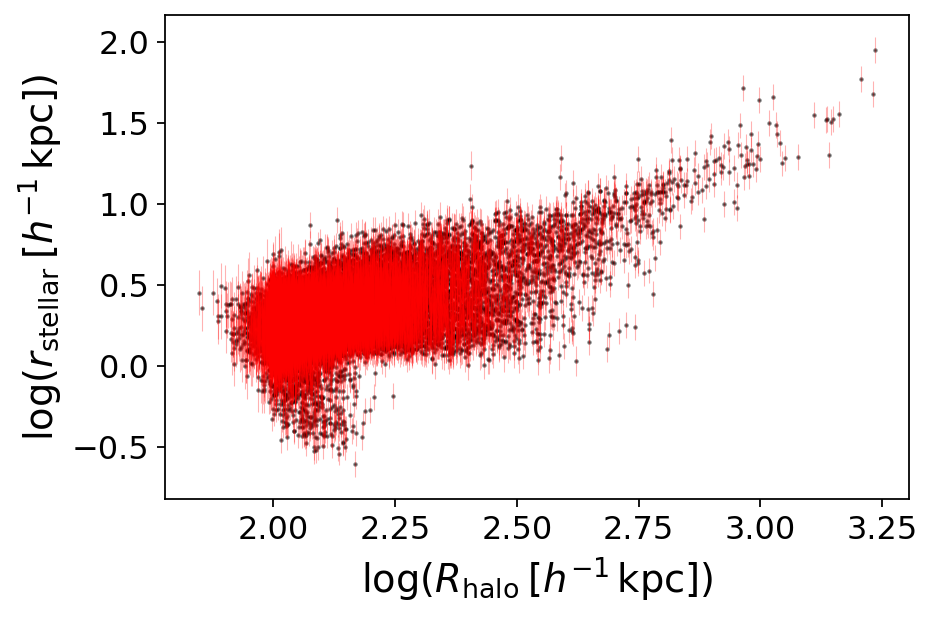

In [21]:
plt.errorbar(log_r_200m, log_r_stellar, yerr=uncertainties_genel2019, color='red', 
             lw=0, elinewidth=0.5, alpha=0.3)#, markersize=20, markerfacecolor='k')
plt.scatter(log_r_200m, log_r_stellar, s=1, c='k', alpha=0.5)

plt.xlabel(utils.label_dict[x_label_name])
plt.ylabel(utils.label_dict[y_label_name])

In [22]:
log_r_200m_train = log_r_200m[idx_train]
log_r_stellar_train = log_r_stellar[idx_train]

Text(0, 0.5, 'log($r_\\mathrm{stellar} \\: [h^{-1} \\, \\mathrm{kpc}]$)')

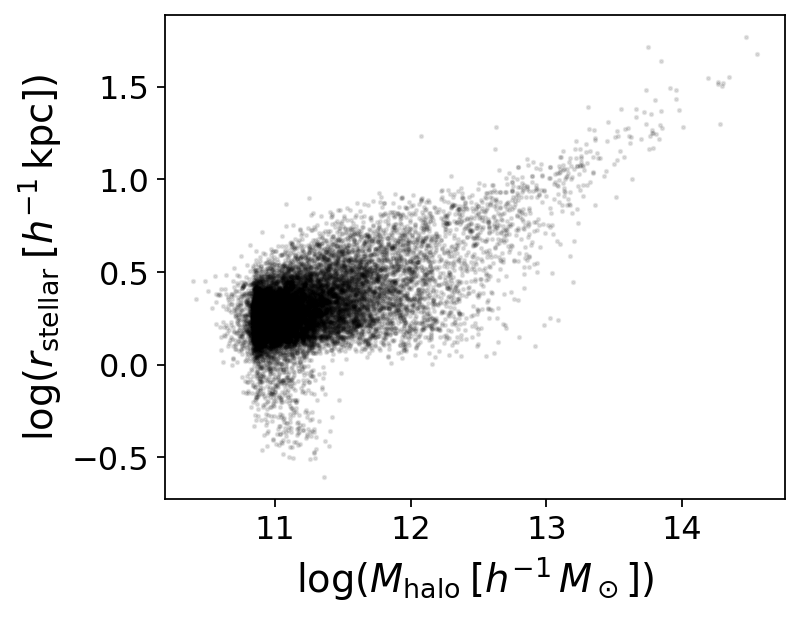

In [23]:
plt.figure(figsize=(5,4))
plt.scatter(log_m_200m_train+log_mass_shift, log_r_stellar_train, s=2, c='k', alpha=0.1)
plt.xlabel(utils.label_dict['m_200m'])
plt.ylabel(utils.label_dict[y_label_name])

Not much better even with known m_stellar:

Text(0, 0.5, 'log($r_\\mathrm{stellar} \\: [h^{-1} \\, \\mathrm{kpc}]$)')

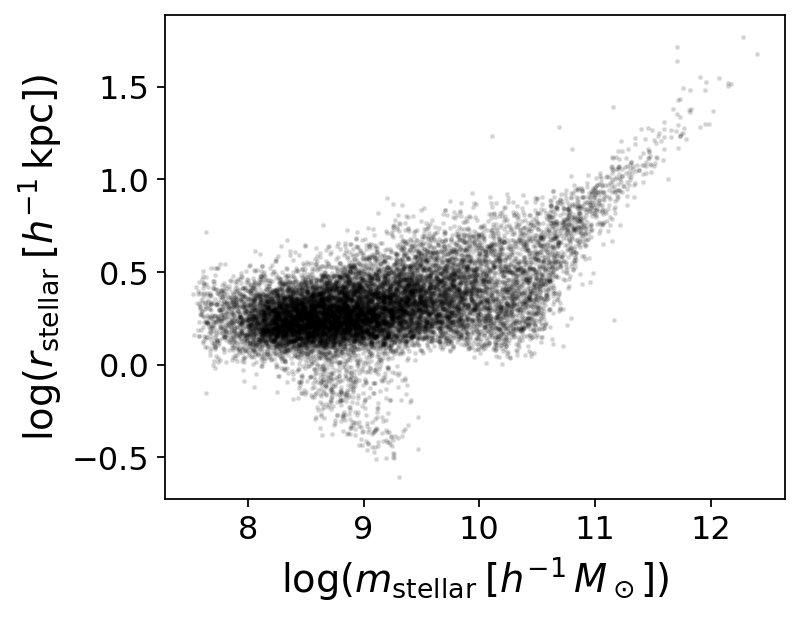

In [24]:
plt.figure(figsize=(5,4))
plt.scatter(log_m_stellar_train+log_mass_shift, log_r_stellar_train, s=2, c='k', alpha=0.1)
plt.xlabel(utils.label_dict['m_stellar'])
plt.ylabel(utils.label_dict[y_label_name])

It does seem to have this weird shape: https://www.researchgate.net/figure/Left-galaxy-size-3D-half-stellar-mass-radius-Re-versus-halo-virial-radius-R-vir-for_fig1_324690757

In [64]:
params_initial_guess = [0]
# try only fitting high-mass end
idx_tofit = log_r_200m_train > 2.7

_, params_best_fit = utils.fit_function(utils.power_law_fixedslope,
                                        log_r_200m_train[idx_tofit], log_r_stellar_train[idx_tofit], 
                                        uncertainties_genel2019_train[idx_tofit], 
                                        params_initial_guess)
y_val_current_powerlaw_fit_train = utils.power_law_fixedslope(log_r_200m_train, *params_best_fit)
y_val_current_powerlaw_fit = utils.power_law_fixedslope(log_r_200m, *params_best_fit)
print(params_best_fit)

[-2.8922202]


Same with M200 and R200 bc those have linear relationship!

Did chi-by-eye for the slope, and just fit the constant

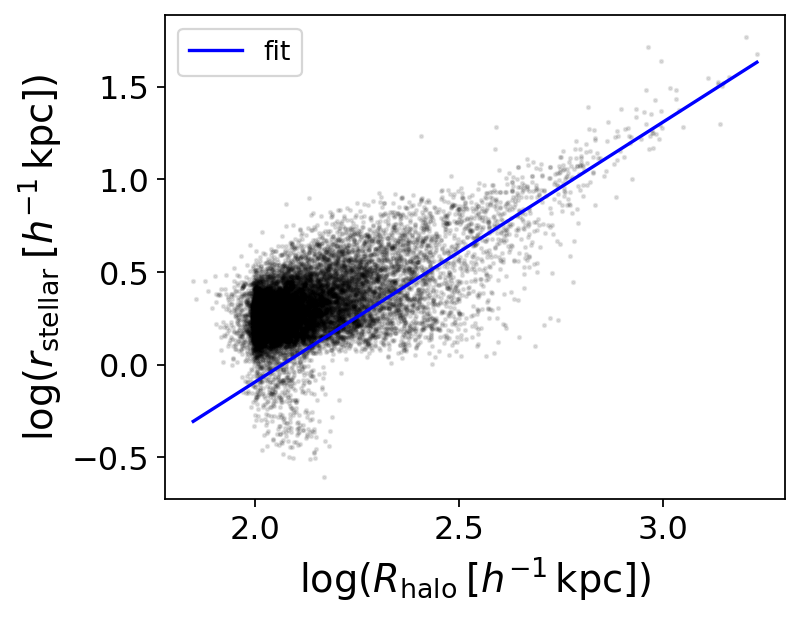

In [65]:
plt.figure(figsize=(5,4))
plt.scatter(log_r_200m_train, log_r_stellar_train, s=2, c='k', alpha=0.1)
# sort for plotting niceness
idx_r_200m = np.argsort(log_r_200m_train)
y_initial_train = utils.power_law_fixedslope(log_r_200m_train, *params_initial_guess)
#plt.plot(log_r_200m_train[idx_r_200m], y_initial_train[idx_r_200m], color='orange', label='initial')
plt.plot(log_r_200m_train[idx_r_200m], y_val_current_powerlaw_fit_train[idx_r_200m], color='blue', label='fit')

plt.xlabel(utils.label_dict[x_label_name])
plt.ylabel(utils.label_dict[y_label_name])
plt.legend(fontsize=12)

## Baseline

In [66]:
log_r_200m.min(), log_r_200m.max()

(1.8472903, 3.2356555)

In [67]:
y_val_current_powerlaw_fit[:3]

array([1.6316988, 1.6376975, 1.5166762], dtype=float32)

In [68]:
y_val_current_powerlaw_fit[:3]

array([1.6316988, 1.6376975, 1.5166762], dtype=float32)

0.14777837972595798


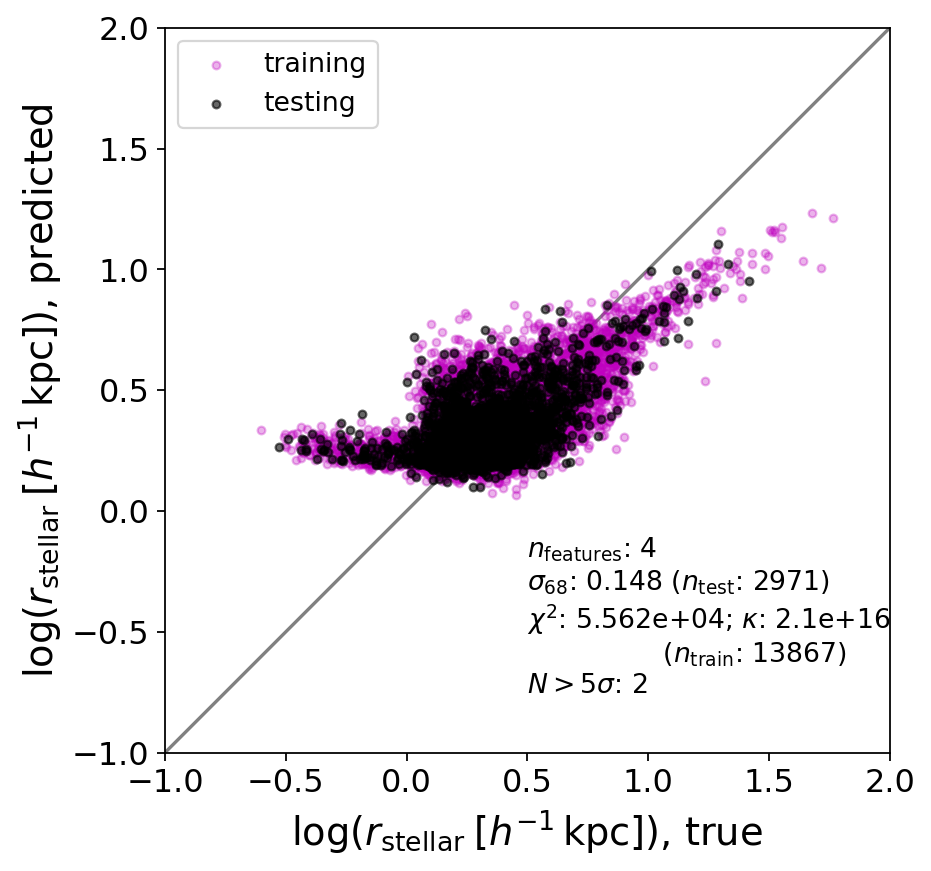

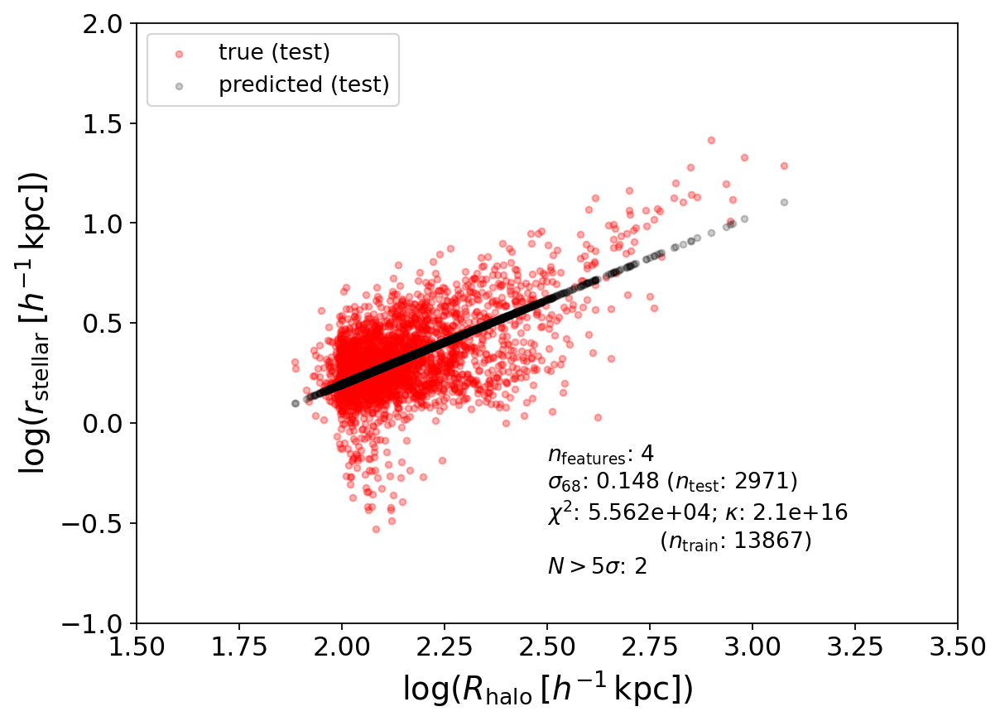

In [69]:
ones_features = np.atleast_2d(np.ones(len(log_r_stellar))).T
x_extra_mtot = np.atleast_2d(np.log10(m_200m)).T
fitter_M = LinearFitter(ones_features, log_r_stellar, 
                    y_val_current_powerlaw_fit, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_extra_mtot)
fitter_M.split_train_test(idx_train, idx_val)
fitter_M.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_M.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_M, log_r_200m, x_lim=(1.5, 3.5),  y_lim=(-1, 2))
error_powerlawM, _ = utils.compute_error(fitter_M, test_error_type='percentile')
print(error_powerlawM)

In [70]:
print(fitter_M.y_scalar_pred[:3])

[1.10290502 1.02062484 0.92568685]


## Full scalar featurizer

In [71]:
from IPython.display import display, Markdown

In [72]:
m_order_max = 2
x_order_max = 4
v_order_max = 4
scalar_tag = f'_3bins_pseudo_rescaled_mord{m_order_max}_xord{x_order_max}_vord{v_order_max}'
scalar_dir = f'../data/scalar_features/scalar_features_{sim_name}'
fn_scalar_features = f'{scalar_dir}/scalar_features{halo_tag}{geo_tag}{scalar_tag}.npy'

print('loading')
scalar_featurizer.load_features(fn_scalar_features)
print('loaded')
s_feats = [s for s in scalar_featurizer.scalar_feature_arr[0]]
for s in s_feats:
    display(Markdown(scalar_name(s, geo_feature_arr_pseudo)))

loading
loaded


$m_0$

$m_1$

$m_2$

$\lambda_3\left(C^{vv}_0\right)$

$\lambda_1\left(C^{vv}_0\right)$

$\lambda_2\left(C^{vv}_0\right)$

$\lambda_3\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_0\right)$

$\lambda_3\left(C^{xx}_0\right)$

$\lambda_1\left(C^{xx}_0\right)$

$\lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_2\right)$

$m_0 \, m_0$

$m_0 \, m_1$

$m_0 \, m_2$

$m_1 \, m_1$

$m_1 \, m_2$

$m_2 \, m_2$

$m_0 \, \lambda_1\left(C^{vv}_0\right)$

$m_0 \, \lambda_2\left(C^{vv}_0\right)$

$m_0 \, \lambda_3\left(C^{vv}_0\right)$

$[v_0]_{j} \, [v_0]_{j}$

$\lambda_1\left(C^{vv}_0\right) \, m_1$

$\lambda_3\left(C^{vv}_0\right) \, m_1$

$m_0 \, \lambda_3\left(C^{vv}_1\right)$

$m_0 \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, m_1$

$[v_0]_{j} \, [v_1]_{j}$

$m_0 \, \lambda_1\left(C^{vv}_1\right)$

$[v_0]_{j} \, [v_2]_{j}$

$m_0 \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, m_2$

$m_0 \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, m_2$

$\lambda_2\left(C^{vv}_0\right) \, m_2$

$m_0 \, \lambda_1\left(C^{vv}_2\right)$

$[v_1]_{j} \, [v_1]_{j}$

$m_1 \, \lambda_1\left(C^{vv}_1\right)$

$m_1 \, \lambda_2\left(C^{vv}_1\right)$

$m_1 \, \lambda_3\left(C^{vv}_1\right)$

$[v_1]_{j} \, [v_2]_{j}$

$m_1 \, \lambda_3\left(C^{vv}_2\right)$

$m_1 \, \lambda_2\left(C^{vv}_2\right)$

$m_1 \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, m_2$

$\lambda_2\left(C^{vv}_1\right) \, m_2$

$\lambda_1\left(C^{vv}_1\right) \, m_2$

$[v_2]_{j} \, [v_2]_{j}$

$m_2 \, \lambda_3\left(C^{vv}_2\right)$

$m_2 \, \lambda_2\left(C^{vv}_2\right)$

$m_2 \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_0\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_0\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_0\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$

$[C^{vv}_0]_{jk} \, [C^{vv}_0]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$[C^{vv}_0]_{jk} \, [C^{vv}_1]_{jk}$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$[C^{vv}_0]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_1\right)$

$[C^{vv}_1]_{jk} \, [C^{vv}_1]_{jk}$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$[C^{vv}_1]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_1\left(C^{vv}_2\right)$

$[C^{vv}_2]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_1\left(C^{vv}_2\right)$

$m_0 \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$[v_0]_{j} \, [x_0]_{j}$

$m_0 \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$m_0 \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$m_0 \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$m_0 \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_1$

$m_0 \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_1$

$[x_0]_{j} \, [v_1]_{j}$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_1$

$[v_0]_{j} \, [x_1]_{j}$

$[v_0]_{j} \, [x_2]_{j}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_2$

$m_0 \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_0 \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_0 \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[x_0]_{j} \, [v_2]_{j}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_2$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_2$

$m_1 \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$[v_1]_{j} \, [x_1]_{j}$

$m_1 \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$m_1 \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$[v_1]_{j} \, [x_2]_{j}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, m_2$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, m_2$

$[x_1]_{j} \, [v_2]_{j}$

$m_1 \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, m_2$

$m_1 \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_1 \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_2 \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[v_2]_{j} \, [x_2]_{j}$

$m_2 \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_2 \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[C^{vv}_0]_{jk} \, [\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_1\right)$

$[C^{vv}_0]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{vv}_1]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[C^{vv}_0]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$[C^{vv}_1]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{vv}_2\right)$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [C^{vv}_2]_{jk}$

$[C^{vv}_1]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[C^{vv}_2]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$m_0 \, \lambda_3\left(C^{xx}_0\right)$

$m_0 \, \lambda_2\left(C^{xx}_0\right)$

$m_0 \, \lambda_1\left(C^{xx}_0\right)$

$[x_0]_{j} \, [x_0]_{j}$

$\lambda_1\left(C^{xx}_0\right) \, m_1$

$\lambda_3\left(C^{xx}_0\right) \, m_1$

$[x_0]_{j} \, [x_1]_{j}$

$\lambda_2\left(C^{xx}_0\right) \, m_1$

$m_0 \, \lambda_1\left(C^{xx}_1\right)$

$m_0 \, \lambda_3\left(C^{xx}_1\right)$

$m_0 \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, m_2$

$\lambda_1\left(C^{xx}_0\right) \, m_2$

$m_0 \, \lambda_1\left(C^{xx}_2\right)$

$m_0 \, \lambda_2\left(C^{xx}_2\right)$

$m_0 \, \lambda_3\left(C^{xx}_2\right)$

$[x_0]_{j} \, [x_2]_{j}$

$\lambda_2\left(C^{xx}_0\right) \, m_2$

$m_1 \, \lambda_3\left(C^{xx}_1\right)$

$[x_1]_{j} \, [x_1]_{j}$

$m_1 \, \lambda_1\left(C^{xx}_1\right)$

$m_1 \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_1\right) \, m_2$

$\lambda_1\left(C^{xx}_1\right) \, m_2$

$m_1 \, \lambda_1\left(C^{xx}_2\right)$

$m_1 \, \lambda_2\left(C^{xx}_2\right)$

$[x_1]_{j} \, [x_2]_{j}$

$\lambda_3\left(C^{xx}_1\right) \, m_2$

$m_1 \, \lambda_3\left(C^{xx}_2\right)$

$m_2 \, \lambda_3\left(C^{xx}_2\right)$

$[x_2]_{j} \, [x_2]_{j}$

$m_2 \, \lambda_1\left(C^{xx}_2\right)$

$m_2 \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$[C^{vv}_0]_{jk} \, [C^{xx}_0]_{jk}$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

$[\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$[C^{vv}_0]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$[C^{xx}_0]_{jk} \, [C^{vv}_1]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$[\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk}$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_1\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[C^{xx}_0]_{jk} \, [C^{vv}_2]_{jk}$

$[C^{vv}_0]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{vv}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk}$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{vv}_2\right)$

$[C^{vv}_1]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

$[\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk}$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$[C^{vv}_1]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$[C^{xx}_1]_{jk} \, [C^{vv}_2]_{jk}$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_2\left(C^{vv}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$[\frac{1}{2} (C^{xv}_1 - C^{vx}_1)]_{jk} \, [\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk}$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_3\left(C^{vv}_2\right)$

$\lambda_2\left(C^{vv}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$[\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk} \, [\frac{1}{2} (C^{xv}_2 - C^{vx}_2)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

$[C^{vv}_2]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{vv}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

$[\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(C^{vv}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{vv}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_0\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_0\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{xx}_0]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_0\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$[C^{xx}_0]_{jk} \, [\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk}$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$[C^{xx}_0]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_2\right)$

$[\frac{1}{2} (C^{xv}_0 + C^{vx}_0)]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_1\right)$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_1\right)$

$[C^{xx}_1]_{jk} \, [\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk}$

$[\frac{1}{2} (C^{xv}_1 + C^{vx}_1)]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(C^{xx}_2\right)$

$[\frac{1}{2} (C^{xv}_2 + C^{vx}_2)]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(\frac{1}{2} (C^{xv}_2 + C^{vx}_2)\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_0\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$[C^{xx}_0]_{jk} \, [C^{xx}_0]_{jk}$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_0\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_0\right)$

$[C^{xx}_0]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$[C^{xx}_0]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_0\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$[C^{xx}_1]_{jk} \, [C^{xx}_1]_{jk}$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_1\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_1\right)$

$[C^{xx}_1]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_2\right)$

$\lambda_1\left(C^{xx}_1\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_2\right) \, \lambda_3\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

$[C^{xx}_2]_{jk} \, [C^{xx}_2]_{jk}$

$\lambda_1\left(C^{xx}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_3\left(C^{xx}_2\right) \, \lambda_1\left(C^{xx}_2\right)$

$\lambda_2\left(C^{xx}_2\right) \, \lambda_2\left(C^{xx}_2\right)$

0.1430127179395967


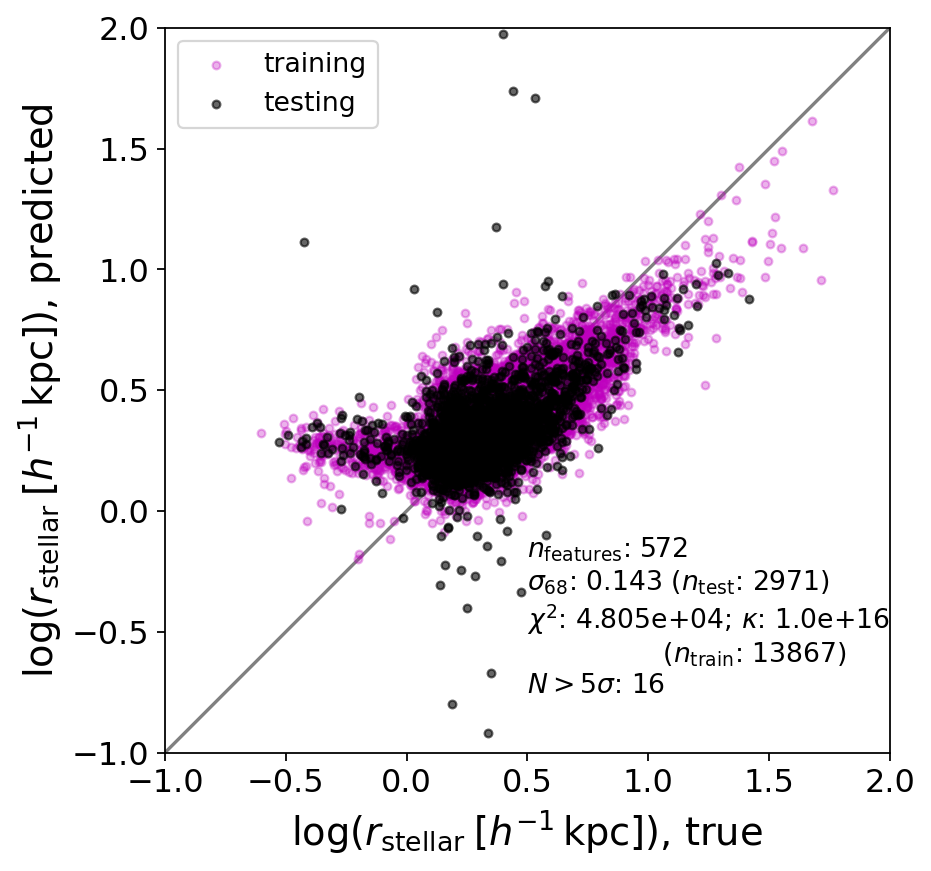

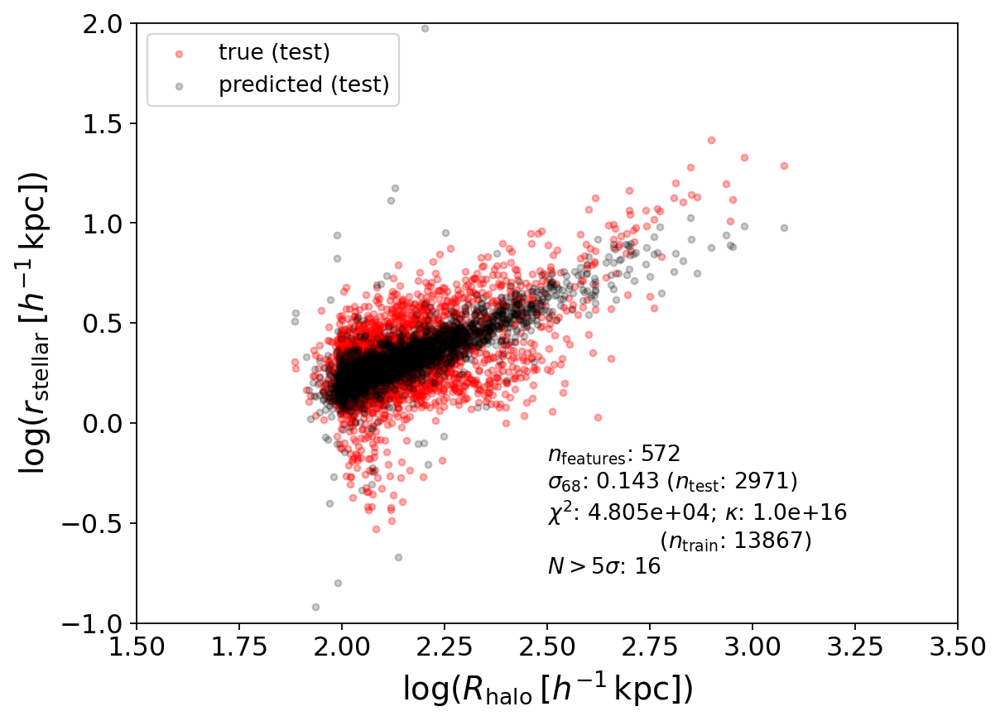

In [73]:
fitter_all = LinearFitter(scalar_featurizer.scalar_features, log_r_stellar, 
                    y_val_current_powerlaw_fit, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_features_extra)
fitter_all.split_train_test(idx_train, idx_val)
fitter_all.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_all.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_all, log_r_200m, x_lim=(1.5, 3.5),  y_lim=(-1, 2))

chi2_all = fitter_all.chi2
error_all, _ = utils.compute_error(fitter_all, test_error_type='percentile')
print(error_all)

In [74]:
print(y_val_current_powerlaw_fit.shape, ones_features.shape)

(19810,) (19810, 1)


0.14304010034102785


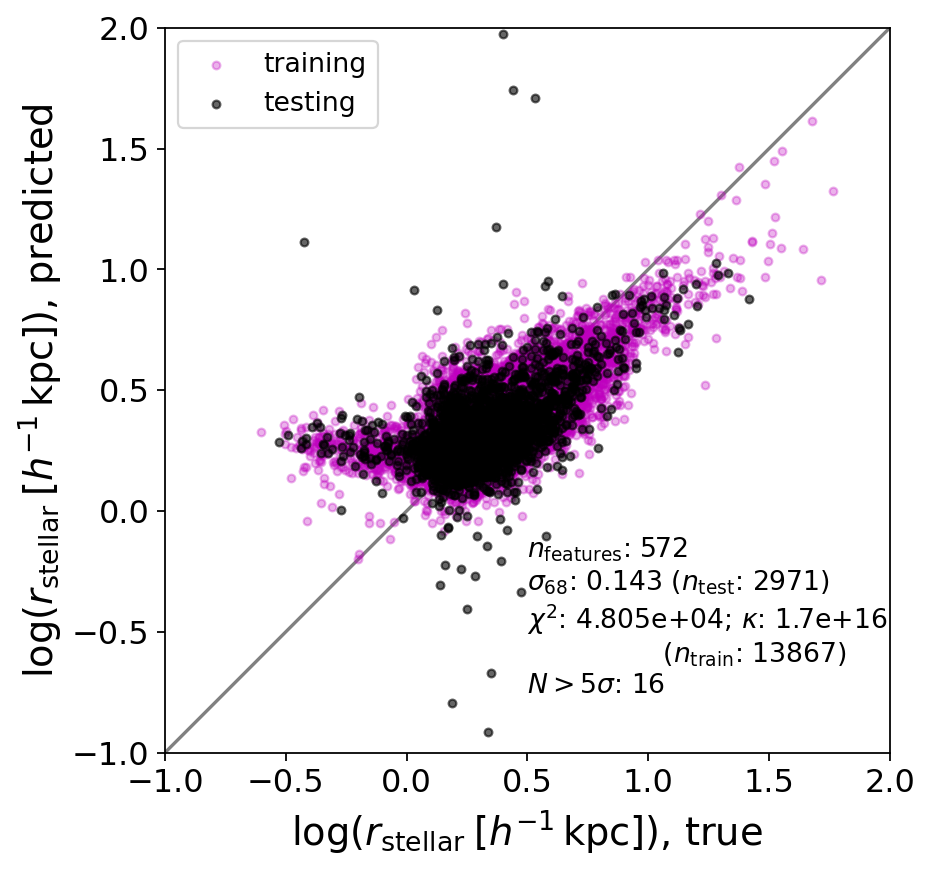

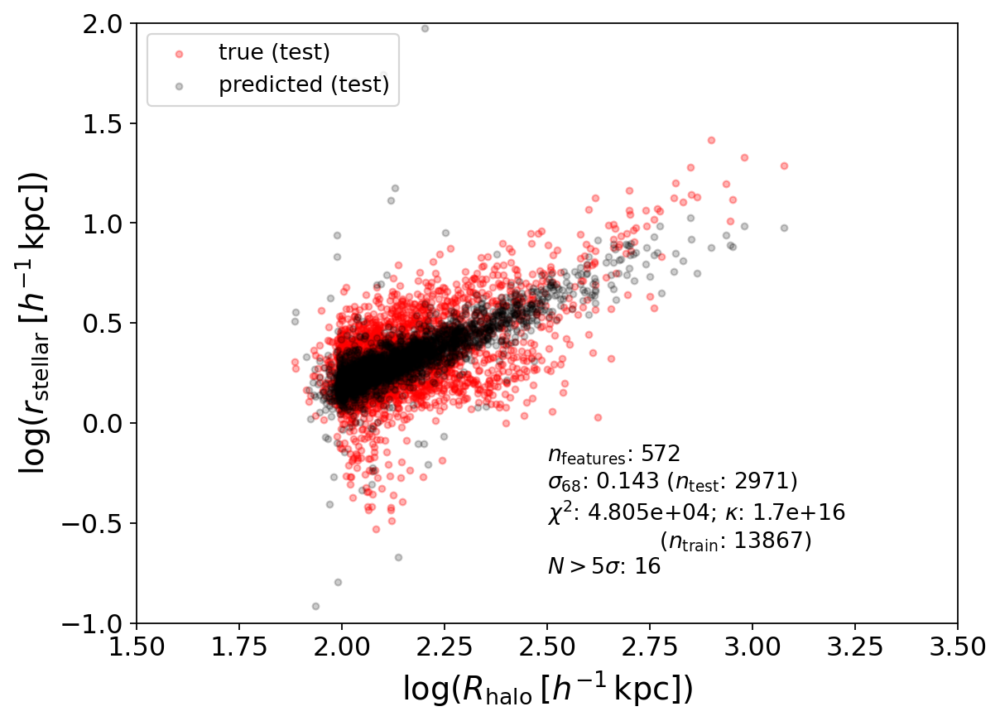

In [75]:
ones = np.ones(len(log_r_stellar))
fitter_all = LinearFitter(scalar_featurizer.scalar_features, log_r_stellar, 
                    ones, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_features_extra)
fitter_all.split_train_test(idx_train, idx_val)
fitter_all.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_all.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_all, log_r_200m, x_lim=(1.5, 3.5),  y_lim=(-1, 2))

chi2_all = fitter_all.chi2
error_all, _ = utils.compute_error(fitter_all, test_error_type='percentile')
print(error_all)

/home/ksf293/equivariant-cosmology/notebooks/../code/utils.py:261: UserWarning: Trying to register the cmap 'shiftedcmap' which already exists.
  plt.register_cmap(cmap=newcmap)


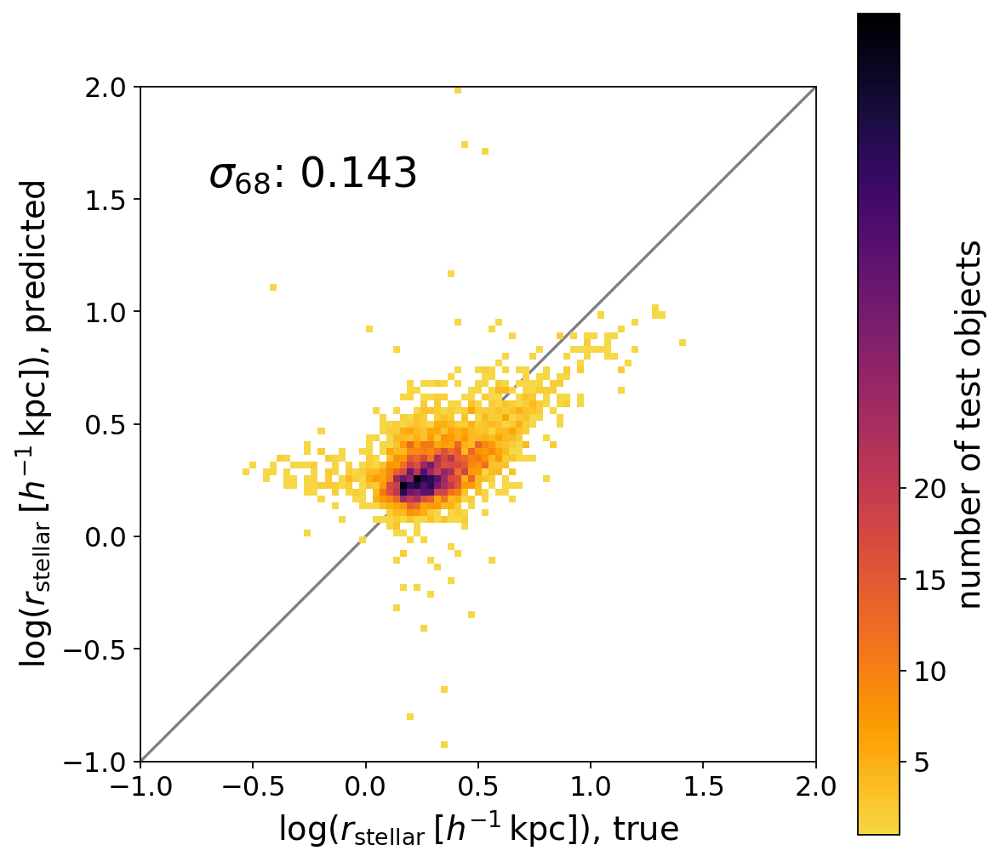

In [83]:
y_true = fitter_all.y_scalar_test
y_pred = fitter_all.y_scalar_pred
error_str = fr"$\sigma_{{68}}$: {error_all:.3f}"
plotter.plot_pred_vs_true_hist(y_label_name, y_true, y_pred, text_results=error_str,
                               x_lim=(-1, 2),  y_lim=(-1, 2))

## Check out outliers

In [37]:
diffs_all = fitter_all.y_scalar_pred - fitter_all.y_scalar_test
percentile_16 = np.percentile(diffs_all, 16, axis=0)
percentile_84 = np.percentile(diffs_all, 84, axis=0)
error_inner68_test = (percentile_84-percentile_16)/2
n_outliers = len(diffs_all[diffs_all > 5*error_inner68_test])
print(n_outliers)

idxs_outliers = np.where(diffs_all > 5*error_inner68_test)[0]

16


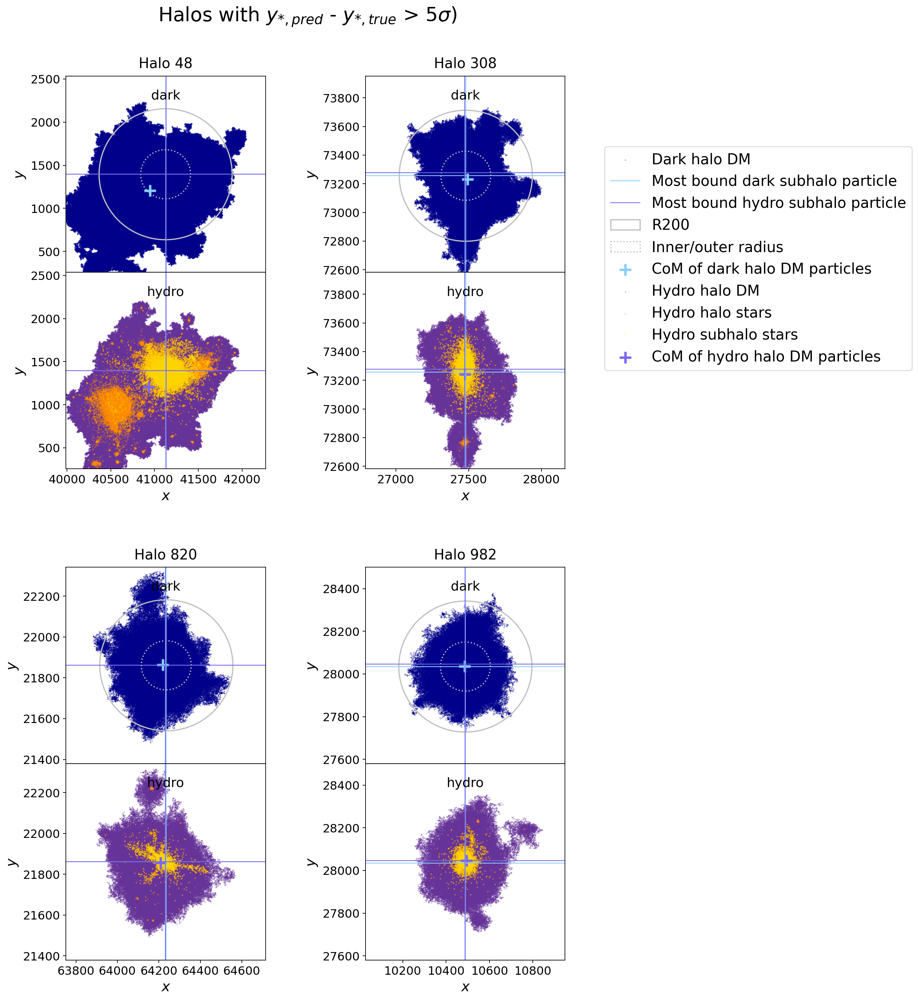

In [38]:
ncols = 2
nrows = 2
title_plot = r'Halos with $y_{*,pred}$ - $y_{*,true}$ > 5$\sigma$)'

idxs_halos = idxs_outliers[:(nrows*ncols)]
halos = sim_reader.dark_halo_arr[idxs_halos]
titles = [f'Halo {idx_halo}' for idx_halo in idxs_halos]
plotter.plot_halos_dark_and_hydro(halos, sim_reader.base_path_dark, sim_reader.base_path_hydro, sim_reader.snap_num,
                             nrows, ncols, titles, title=title_plot)

# Feature importance

In [40]:
top_n = 12
features_all = scalar_featurizer.scalar_features
feature_imp_results = feature_importance.get_importance_order_addonein(features_all, log_r_stellar, y_val_current_powerlaw_fit,
                            idx_train, idx_val, top_n=top_n,
                            uncertainties=uncertainties_genel2019, x_features_extra=x_features_extra)
idxs_ordered_best, errors_best, chi2s_best, groups = feature_imp_results

#0 most important
#1 most important
#2 most important
#3 most important
#4 most important
#5 most important
#6 most important
#7 most important
#8 most important
#9 most important
#10 most important
#11 most important


In [41]:
for i, idx in enumerate(idxs_ordered_best[:50]):
    display(Markdown(f'{i}: {errors_best[i]:.8f}: {scalar_name(s_feats[idx], geo_feature_arr_pseudo)}, {s_feats[idx].value}'))

0: 0.14555619: $\lambda_3\left(C^{xx}_0\right) \, \lambda_3\left(C^{xx}_0\right)$, 1.7011682803301276e-05

1: 0.14397732: $\lambda_3\left(C^{xx}_1\right) \, \lambda_2\left(C^{xx}_1\right)$, 0.0006975631939907873

2: 0.14192980: $[\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk} \, [\frac{1}{2} (C^{xv}_0 - C^{vx}_0)]_{jk}$, 2.1205708483827294e-05

3: 0.14026512: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right)$, -1.0950386785728932e-05

4: 0.13876609: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{xx}_0\right)$, 0.0013502312313966758

5: 0.13829646: $\lambda_2\left(C^{vv}_1\right) \, \lambda_1\left(C^{xx}_1\right)$, 0.016368557928873952

6: 0.13800902: $\lambda_2\left(C^{xx}_0\right) \, \lambda_1\left(\frac{1}{2} (C^{xv}_1 + C^{vx}_1)\right)$, -9.01680856277153e-06

7: 0.13792328: $\lambda_3\left(C^{vv}_0\right) \, \lambda_1\left(C^{vv}_0\right)$, 0.041312901318955146

8: 0.13762954: $m_1 \, \lambda_3\left(C^{xx}_1\right)$, 0.0083819183143653

9: 0.13717455: $\lambda_3\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_2$, -0.0013783291375191733

10: 0.13693894: $\lambda_2\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, \lambda_3\left(C^{vv}_2\right)$, -7.915067806553353e-05

11: 0.13690699: $\lambda_1\left(\frac{1}{2} (C^{xv}_0 + C^{vx}_0)\right) \, m_1$, 0.0006594035628537069

11


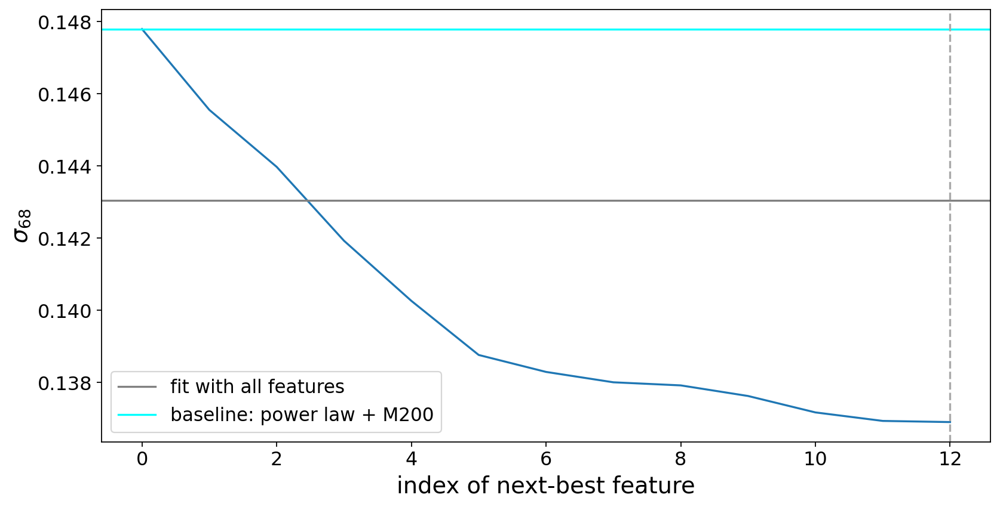

In [42]:
plt.figure(figsize=(12,6))
errors_best_withfirst = [error_powerlawM] + errors_best
plt.plot(errors_best_withfirst)
plt.axhline(error_all, color='grey', label='fit with all features')
#plt.axhline(error_powerlaw, color='magenta', label='fit with all')
plt.axhline(error_powerlawM, color='cyan', label='baseline: power law + M200')

n_min = np.argmin(errors_best)
plt.axvline(12, color='darkgrey', ls='--')
#plt.axvline(202, color='darkgrey', ls='--')
#plt.axvline(n_min, color='darkgrey', ls='--')
print(n_min)
plt.xlabel('index of next-best feature')
plt.ylabel(r'$\sigma_{68}$')

plt.legend(fontsize=14)

0.13691976644135906


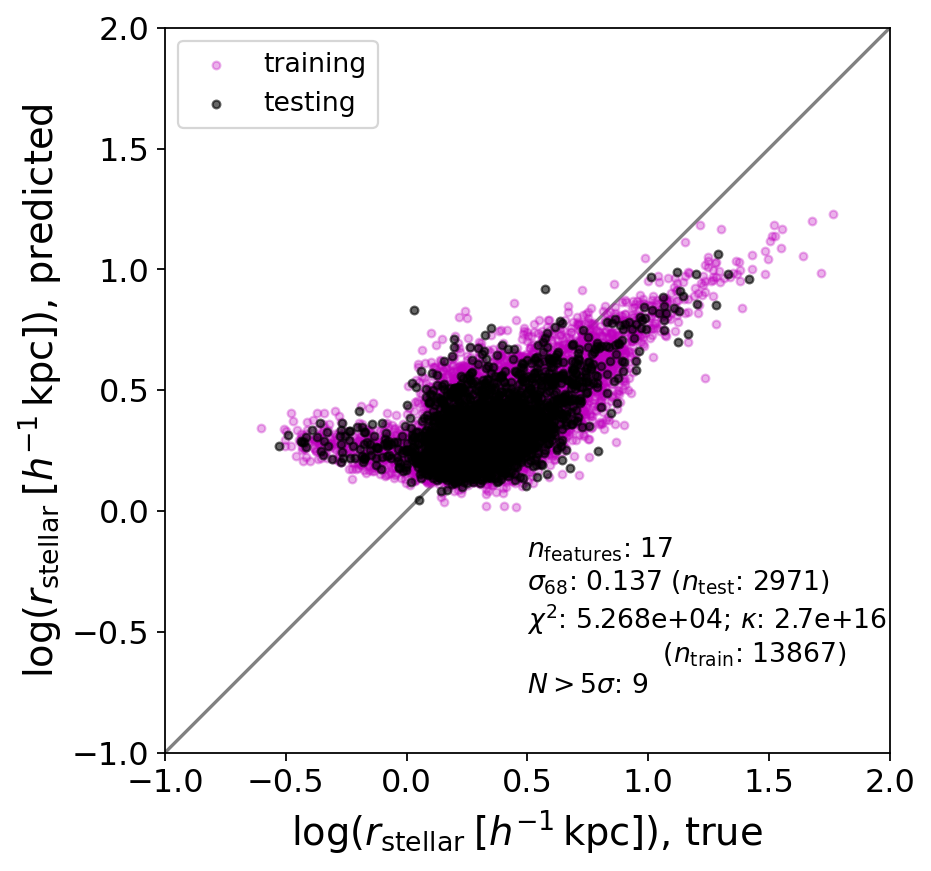

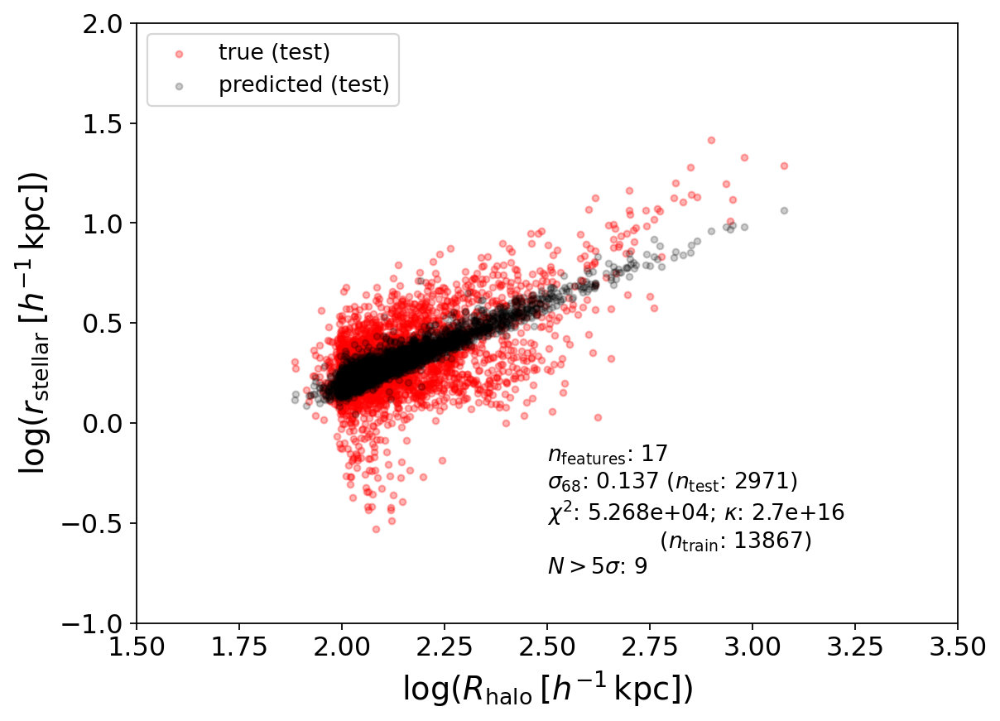

In [44]:
ones = np.ones(len(log_r_stellar))
features_topn = scalar_featurizer.scalar_features[:,idxs_ordered_best[:12]]
fitter_topn = LinearFitter(features_topn, log_r_stellar, 
                    ones, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_features_extra)
fitter_topn.split_train_test(idx_train, idx_val)
fitter_topn.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_topn.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_topn, log_r_200m, x_lim=(1.5, 3.5),  y_lim=(-1, 2))

chi2_topn = fitter_topn.chi2
error_topn, _ = utils.compute_error(fitter_topn, test_error_type='percentile')
print(error_topn)

# Neural net

In [45]:
from neural_net import NNFitter, NeuralNet
nnfitter = NNFitter(features_topn, log_r_stellar, 
                y_val_current_powerlaw_fit, x_features_extra=x_features_extra)
nnfitter.split_train_test(idx_train, idx_val)
nnfitter.set_up_data()

In [46]:
input_size = nnfitter.n_A_features
hidden_size = 32
nnfitter.model = NeuralNet(input_size, hidden_size=hidden_size)
nnfitter.train(max_epochs=250, learning_rate=0.0005)

Text(0, 0.5, 'loss')

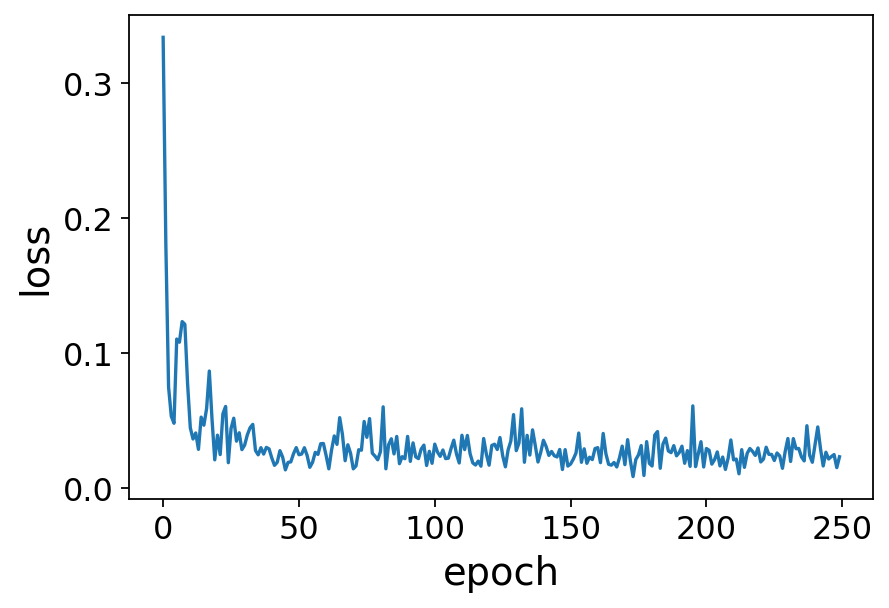

In [47]:
plt.plot(nnfitter.loss)
plt.xlabel('epoch')
plt.ylabel('loss')

In [48]:
nnfitter.predict_test()

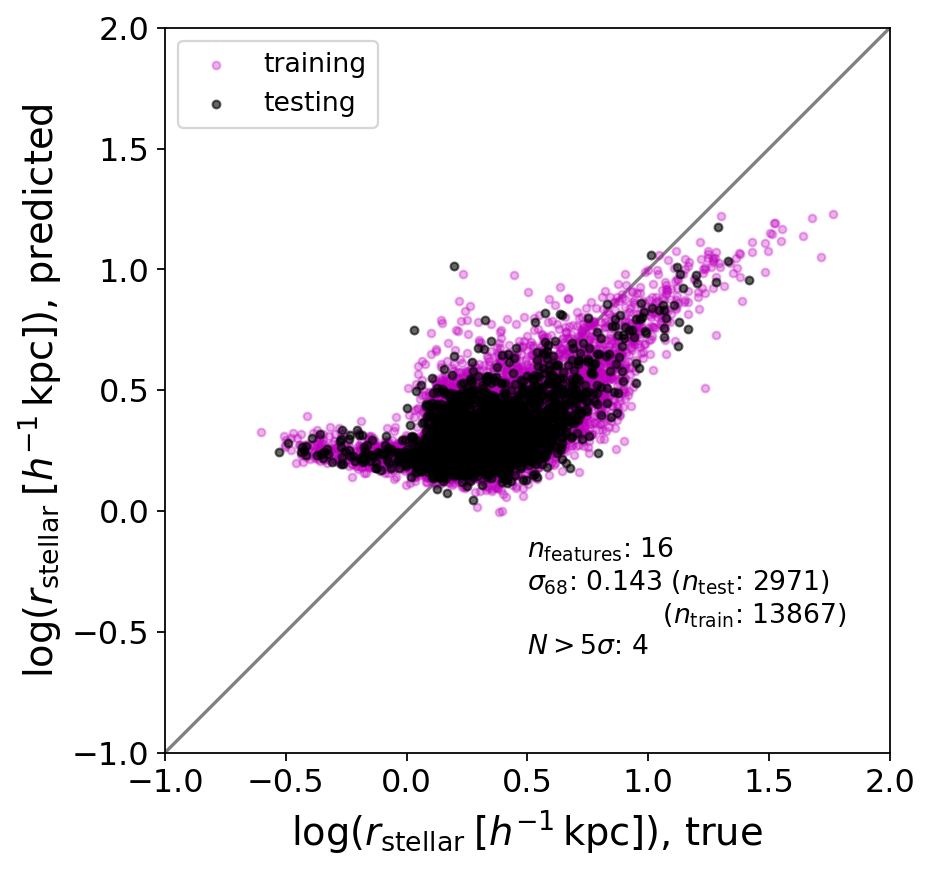

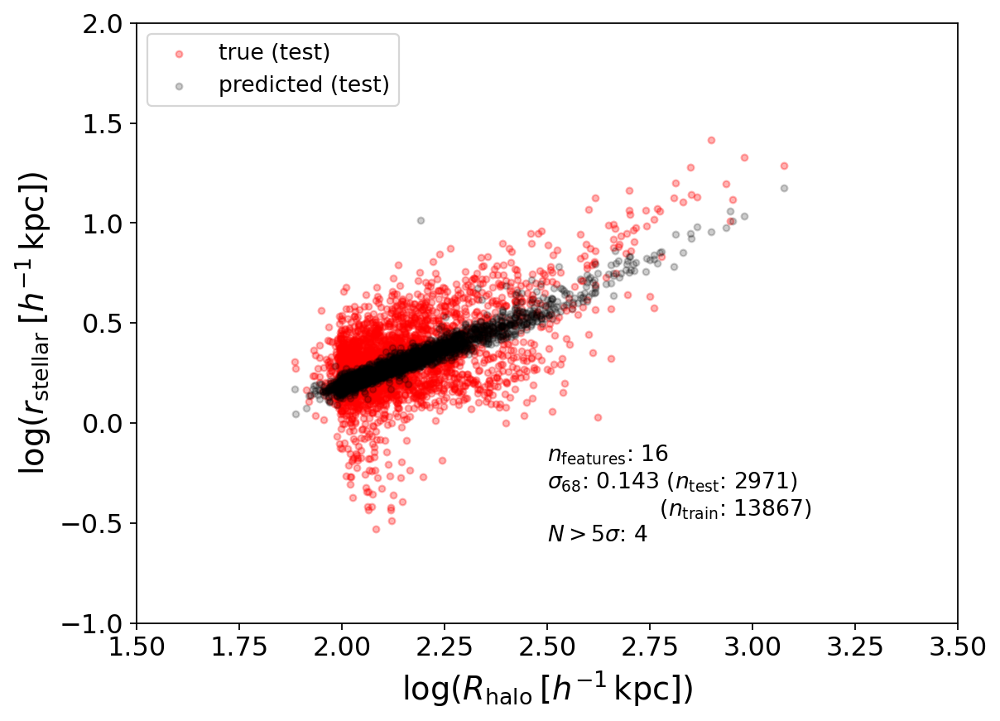

In [49]:
plotter.plot_fits(x_label_name, y_label_name, nnfitter, log_r_200m, x_lim=(1.5, 3.5),  y_lim=(-1, 2))

## Halo catalog features

In [50]:
catalog_feature_names = ['M200c', 'c200c', 'a_form']
idxs_nan_structure_catalog = sim_reader.get_structure_catalog_features(catalog_feature_names)
print(sim_reader.x_catalog_features.shape)

81 halos with NaN values of structure properties detected!
(19810, 3)


In [51]:
x_catalog_features = sim_reader.x_catalog_features
x_catalog_features[:,1] = np.log10(x_catalog_features[:,1])

0.13691976644135906


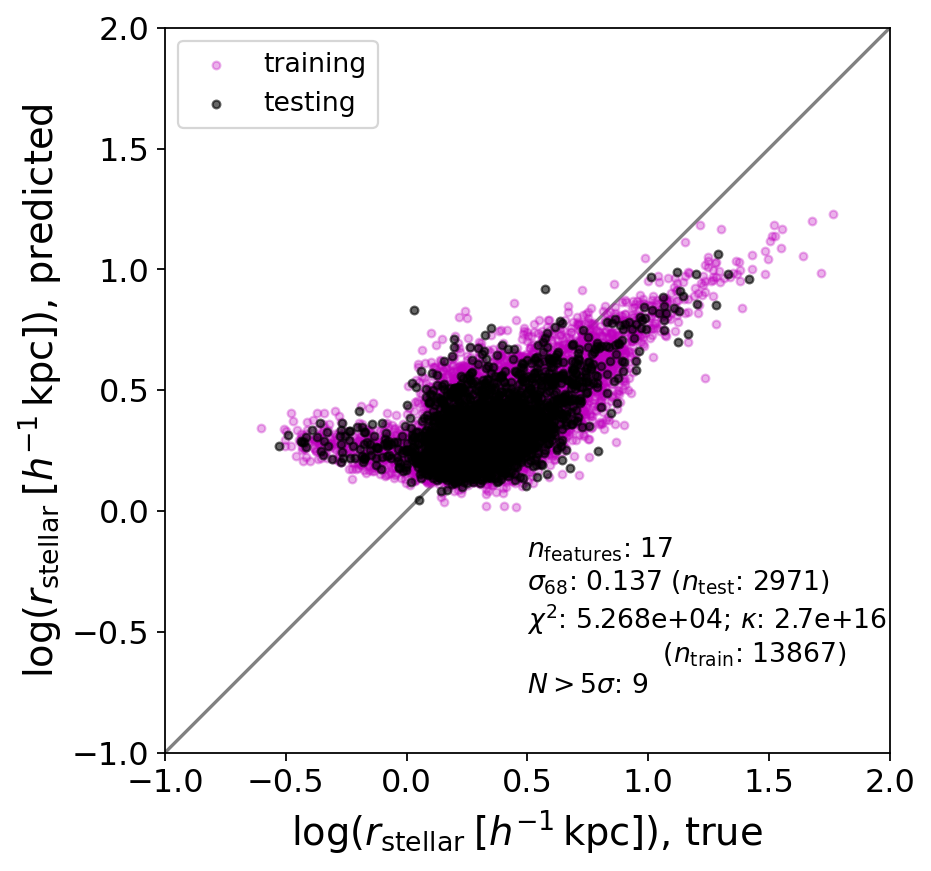

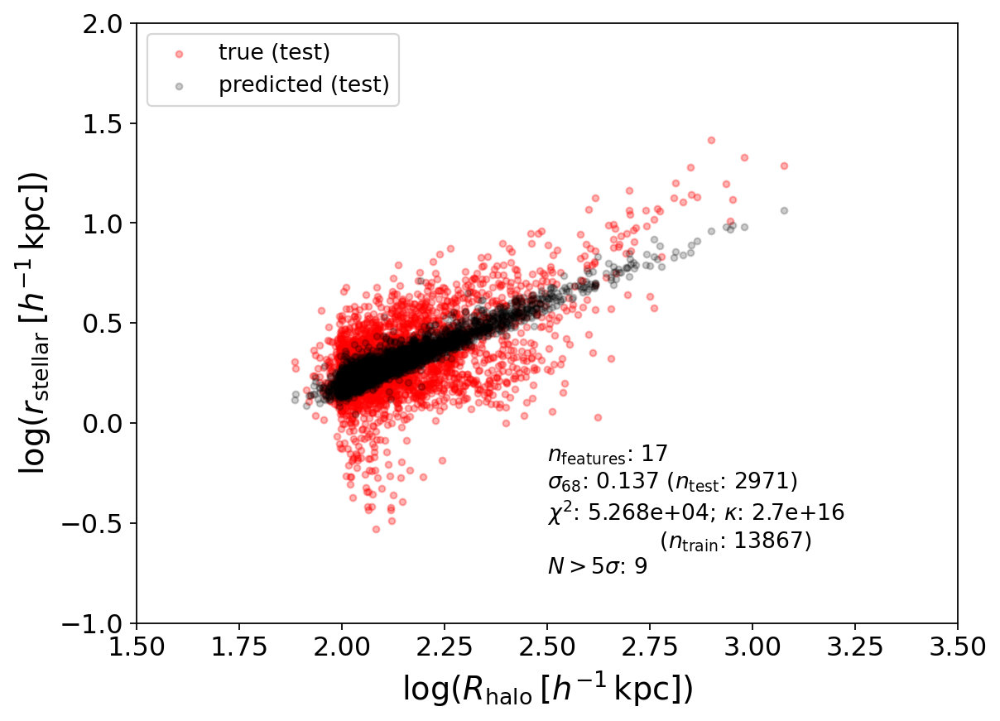

In [52]:
ones = np.ones(len(log_r_stellar))
features_catalog = scalar_featurizer.scalar_features[:,idxs_ordered_best[:30]]
fitter_catalog = LinearFitter(features_catalog, log_r_stellar, 
                    ones, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_features_extra)
fitter_catalog.split_train_test(idx_train, idx_val)
fitter_catalog.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_catalog.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_catalog, log_r_200m, x_lim=(1.5, 3.5),  y_lim=(-1, 2))

chi2_catalog = fitter_catalog.chi2
error_catalog, _ = utils.compute_error(fitter_catalog, test_error_type='percentile')
print(error_catalog)

# sSFR

In [84]:
y_label_name = 'ssfr'

In [85]:
sim_reader.add_catalog_property_to_halos('sfr_hydro_subhalo_star')
sfr_orig = np.array([dark_halo.catalog_properties['sfr_hydro_subhalo_star'] for dark_halo in sim_reader.dark_halo_arr])


In [126]:
idx_zerosfr = (sfr_orig==0)
idx_sfing = (sfr_orig>0)
zerosfr_replacements = 1e-3 # estimated based on resoluton; see notes
sfr = sfr_orig
sfr[idx_zerosfr] = zerosfr_replacements

In [87]:
log_sfr = np.log10(sfr)

0.00029305374 99.81936


Text(0, 0.5, 'number per bin')

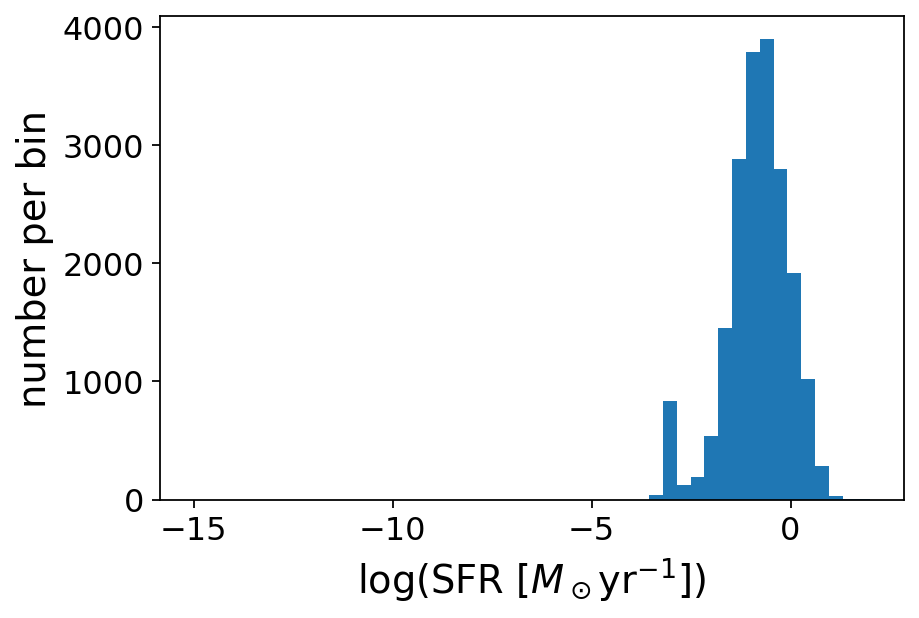

In [89]:
y_label_sfr=r'log(SFR $[M_\odot \mathrm{yr}^{-1}]$)'
print(np.min(sfr), np.max(sfr))
bins = np.linspace(-15, 2)
_ = plt.hist(log_sfr, bins=bins)
plt.xlabel(y_label_sfr)
plt.ylabel('number per bin')

In [91]:
# little h via https://www.tng-project.org/data/downloads/TNG100-1/
h = 0.6774  
m_stellar_Msun = (m_stellar*mass_multiplier)/h
ssfr = sfr/m_stellar_Msun
log_ssfr = np.log10(ssfr)

1.4586641e-15 1.4586641e-15 4.596792e-09
[-15.         -14.85714286 -14.71428571 -14.57142857 -14.42857143
 -14.28571429 -14.14285714 -14.         -13.85714286 -13.71428571
 -13.57142857 -13.42857143 -13.28571429 -13.14285714 -13.
 -12.85714286 -12.71428571 -12.57142857 -12.42857143 -12.28571429
 -12.14285714 -12.         -11.85714286 -11.71428571 -11.57142857
 -11.42857143 -11.28571429 -11.14285714 -11.         -10.85714286
 -10.71428571 -10.57142857 -10.42857143 -10.28571429 -10.14285714
 -10.          -9.85714286  -9.71428571  -9.57142857  -9.42857143
  -9.28571429  -9.14285714  -9.          -8.85714286  -8.71428571
  -8.57142857  -8.42857143  -8.28571429  -8.14285714  -8.        ]


Text(0, 0.5, 'number per bin')

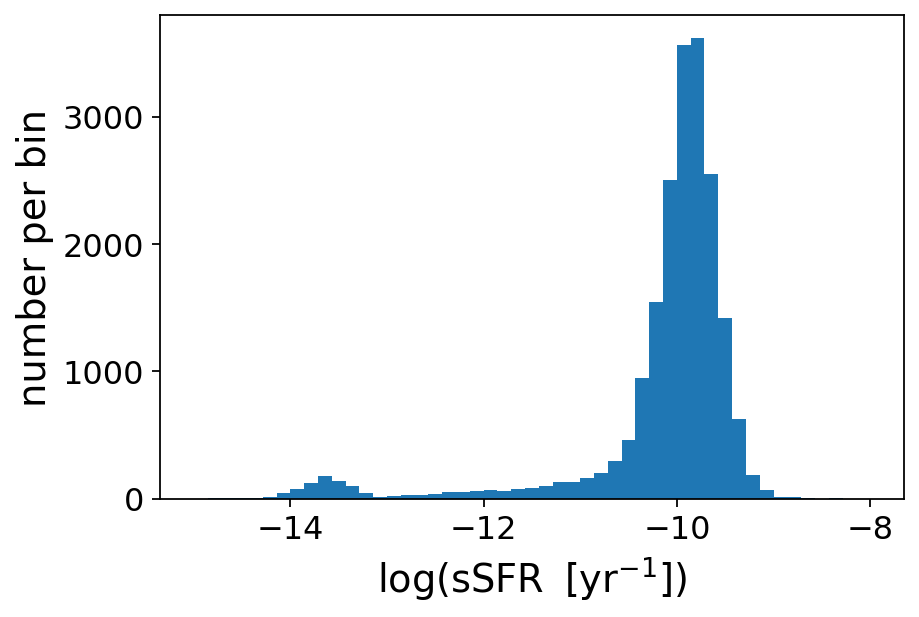

In [94]:
y_label_name='ssfr'
print(np.min(ssfr), np.min(ssfr[np.nonzero(ssfr)]),  np.max(ssfr))
bins = np.linspace(-15, -8)
print(bins)
_ = plt.hist(log_ssfr, bins=bins)
plt.xlabel(utils.label_dict[y_label_name])
plt.ylabel('number per bin')
#plt.yscale('log')

In [95]:
log_ssfr_train = log_ssfr[idx_train]
log_sfr_train = log_sfr[idx_train]

Text(0, 0.5, 'log(sSFR $\\: [\\mathrm{yr}^{-1}]$)')

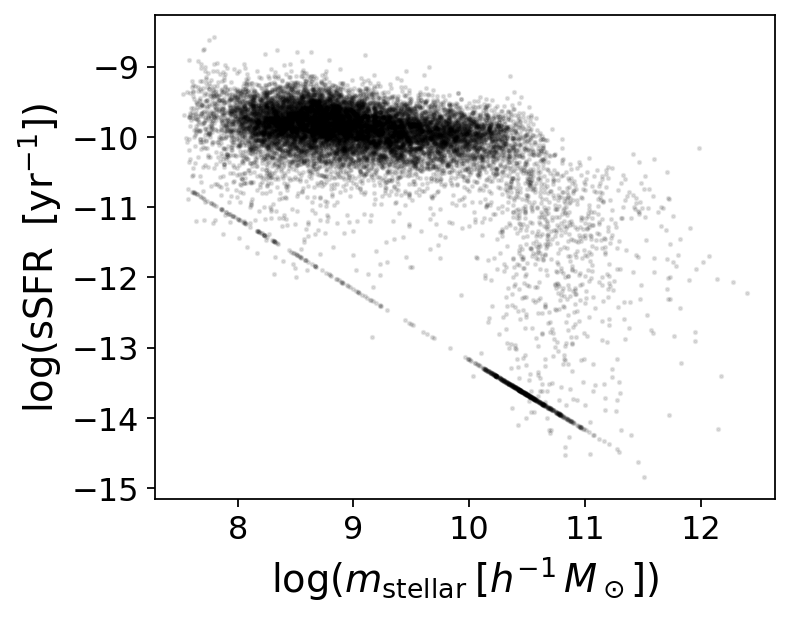

In [96]:
plt.figure(figsize=(5,4))
plt.scatter(log_m_stellar_train+log_mass_shift, log_ssfr_train, s=2, c='k', alpha=0.1)
plt.xlabel(utils.label_dict['m_stellar'])
plt.ylabel(utils.label_dict[y_label_name])

Text(0, 0.5, 'log(sSFR $\\: [\\mathrm{yr}^{-1}]$)')

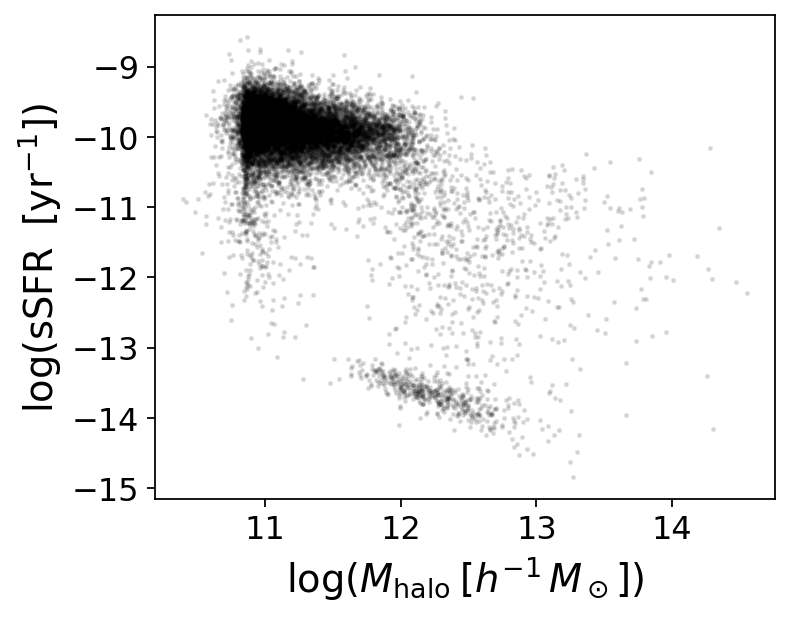

In [97]:
plt.figure(figsize=(5,4))
plt.scatter(log_m_200m_train+log_mass_shift, log_ssfr_train, s=2, c='k', alpha=0.1)
plt.xlabel(utils.label_dict['m_200m'])
plt.ylabel(utils.label_dict[y_label_name])

Fitting function: https://arxiv.org/abs/1812.07584

In [98]:
uncertainties_genel2019_sfr = utils.get_uncertainties_genel2019('sfr', log_m_stellar+log_mass_shift, sim_name)
uncertainties_genel2019_sfr_train = uncertainties_genel2019_sfr[idx_train]

In [118]:
#sfr_train = sfr_orig[idx_train]
#idx_sfing_train = np.where(sfr_train>0)[0]
print(len(sfr_train), len(idx_sfing_train))

13867 13867


In [136]:
params_initial_guess = [1,0]

idx_nonzerosfr = (log_sfr_train > np.log10(zerosfr_replacements))
idx_lowm = (log_m_stellar_train+log_mass_shift < 10.5)
idx_fit = idx_nonzerosfr & idx_lowm

y_val_current_powerlaw_fit_sfr_train_sfing, params_best_fit = utils.fit_function(
                                                        utils.power_law,
                                                        log_m_stellar_train[idx_fit], log_sfr_train[idx_fit], 
                                                        uncertainties_genel2019_sfr_train[idx_fit], 
                                                        params_initial_guess)
y_val_current_powerlaw_fit_sfr = utils.power_law(log_m_stellar, *params_best_fit)
y_val_current_powerlaw_fit_sfr_train = y_val_current_powerlaw_fit_sfr[idx_train]

print(params_best_fit)

y_val_current_powerlaw_fit = y_val_current_powerlaw_fit_sfr/m_stellar_Msun
y_val_current_powerlaw_fit_train = y_val_current_powerlaw_fit[idx_train]
#y_val_current_powerlaw_fit_train = y_val_current_powerlaw_fit_sfr_train/m_stellar_Msun[idx_train]

[0.80216057 0.07474948]


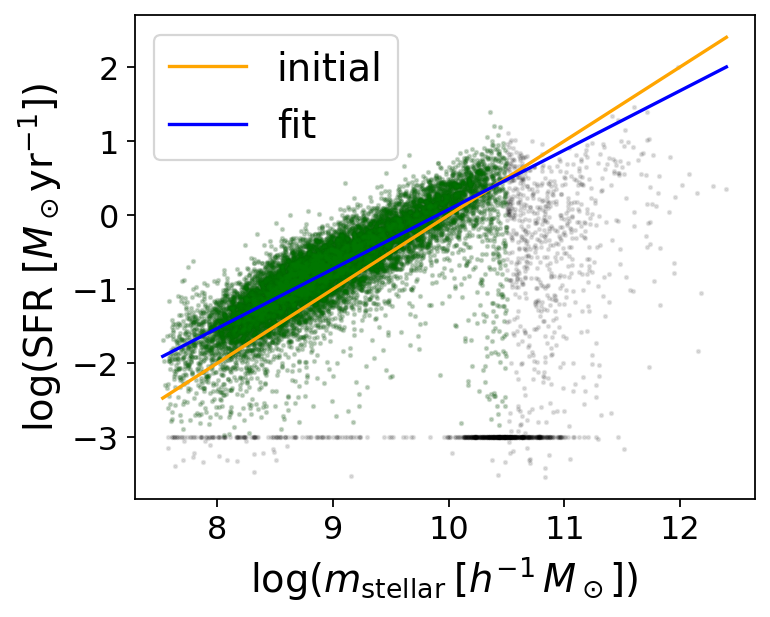

In [138]:
plt.figure(figsize=(5,4))
plt.scatter(log_m_stellar_train+log_mass_shift, log_sfr_train, s=2, c='k', alpha=0.1)

idx_mstellar = np.argsort(log_m_stellar_train)
y_initial_train = utils.power_law(log_m_stellar_train, *params_initial_guess)
plt.plot(log_m_stellar_train[idx_mstellar]+log_mass_shift, y_initial_train[idx_mstellar], color='orange', label='initial')
plt.plot(log_m_stellar_train[idx_mstellar]+log_mass_shift, y_val_current_powerlaw_fit_sfr_train[idx_mstellar], color='blue', label='fit')

#plt.scatter(log_m_stellar_train[idx_lowm]+log_mass_shift, log_sfr_train[idx_lowm], s=2, c='r')
plt.scatter(log_m_stellar_train[idx_fit]+log_mass_shift, log_sfr_train[idx_fit], s=2, c='g', alpha=0.1)

plt.xlabel(utils.label_dict['m_stellar'])
plt.ylabel(y_label_sfr)
plt.legend()

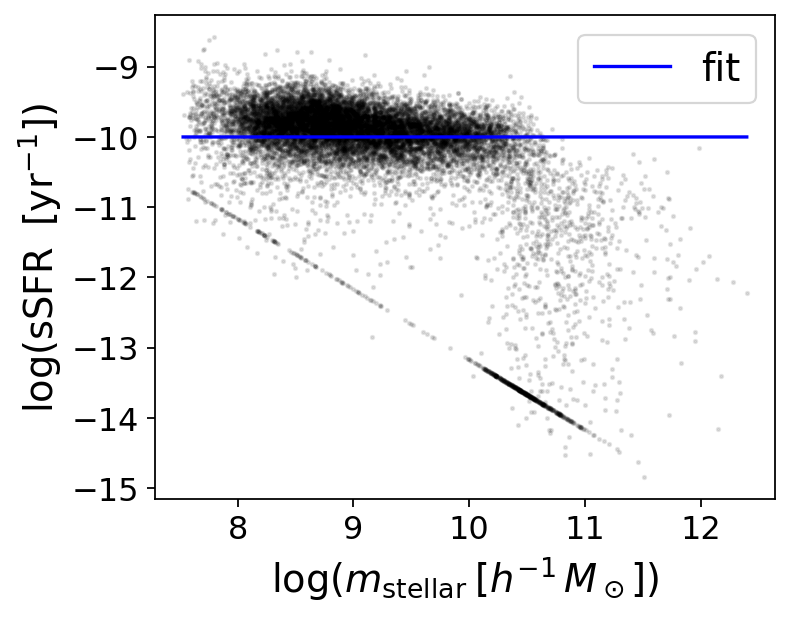

In [139]:
plt.figure(figsize=(5,4))
plt.scatter(log_m_stellar_train+log_mass_shift, log_ssfr_train, s=2, c='k', alpha=0.1)

idx_mstellar = np.argsort(log_m_stellar_train)
plt.plot(log_m_stellar_train[idx_mstellar]+log_mass_shift, y_val_current_powerlaw_fit_train[idx_mstellar]-log_mass_shift, color='blue', label='fit')

plt.xlabel(utils.label_dict['m_stellar'])
plt.ylabel(utils.label_dict[y_label_name])
plt.legend()

TODO: These uncertainties are wrong!!

0.43094953676691783


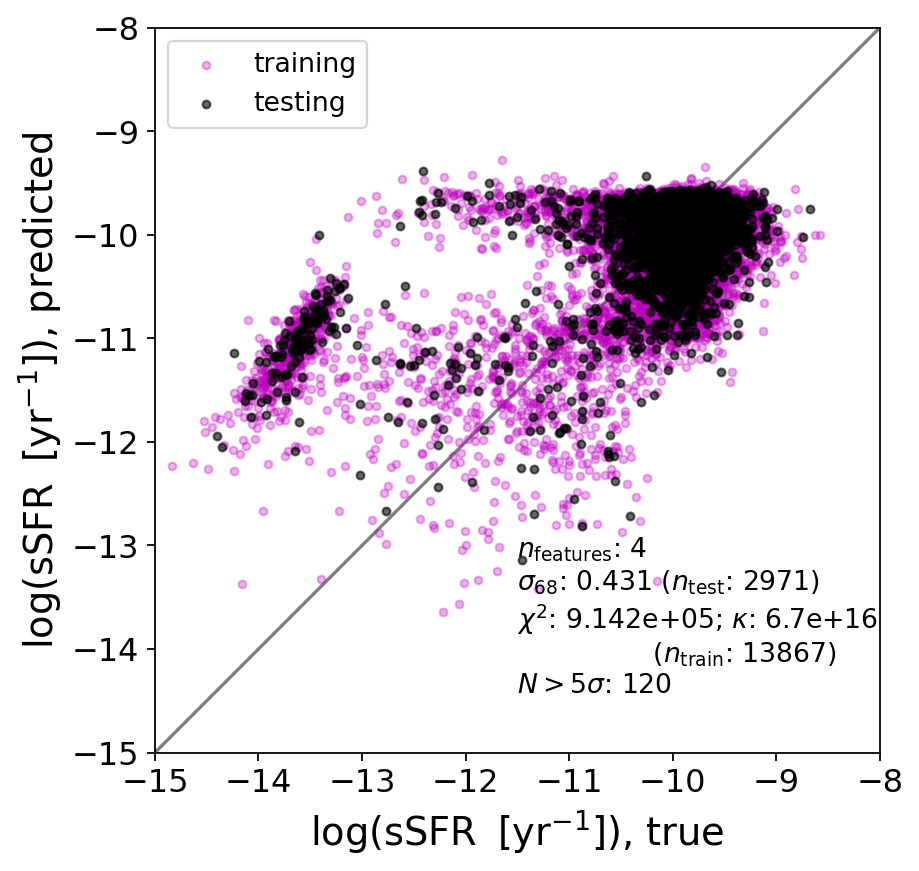

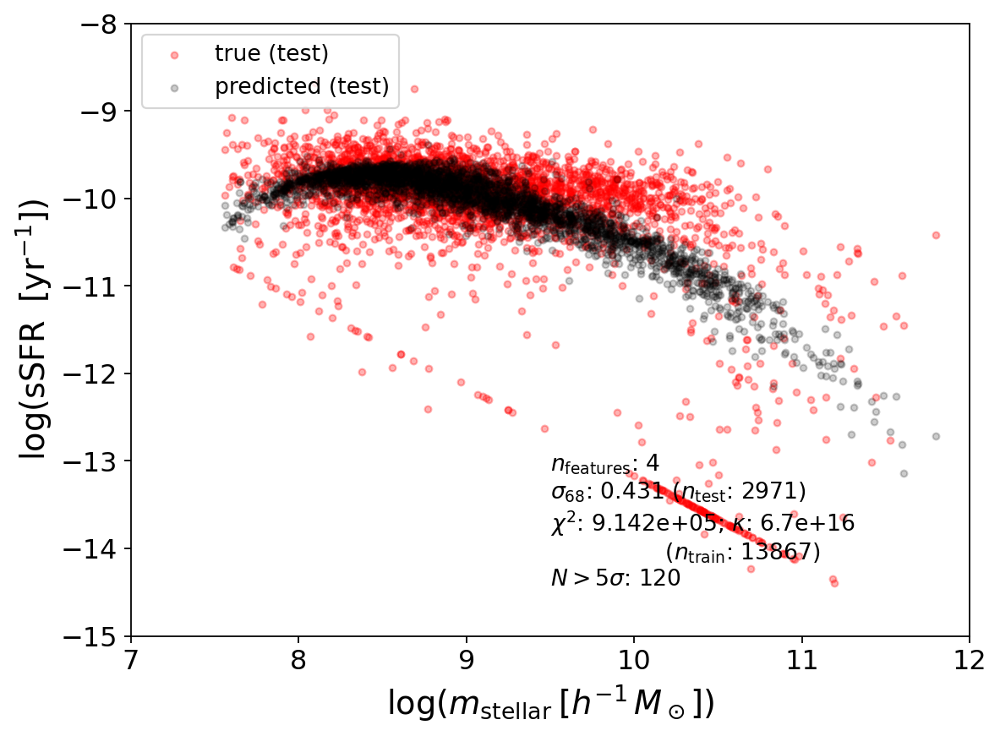

In [141]:
x_label_name = 'm_stellar'
ones_features = np.atleast_2d(np.ones(len(log_m_stellar))).T
x_extra_mtot = np.atleast_2d(np.log10(m_200m)).T
fitter_M = LinearFitter(ones_features, log_ssfr, 
                    y_val_current_powerlaw_fit, uncertainties=uncertainties_genel2019,
                    x_features_extra=x_extra_mtot)
fitter_M.split_train_test(idx_train, idx_val)
fitter_M.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_M.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_M, log_m_stellar, x_lim=(7, 12),  y_lim=(-15, -8))
error_powerlawM, _ = utils.compute_error(fitter_M, test_error_type='percentile')
print(error_powerlawM)

In [142]:
from neural_net import NNFitter, NeuralNet
nnfitter_ssfr = NNFitter(features_topn, log_ssfr, 
                y_val_current_powerlaw_fit, x_features_extra=x_features_extra)
nnfitter_ssfr.split_train_test(idx_train, idx_val)
nnfitter_ssfr.set_up_data()

NameError: name 'features_topn' is not defined

In [143]:
input_size = nnfitter_ssfr.n_A_features
hidden_size = 32
nnfitter_ssfr.model = NeuralNet(input_size, hidden_size=hidden_size)
nnfitter_ssfr.train(max_epochs=250, learning_rate=0.0005)

NameError: name 'nnfitter_ssfr' is not defined

Text(0, 0.5, 'loss')

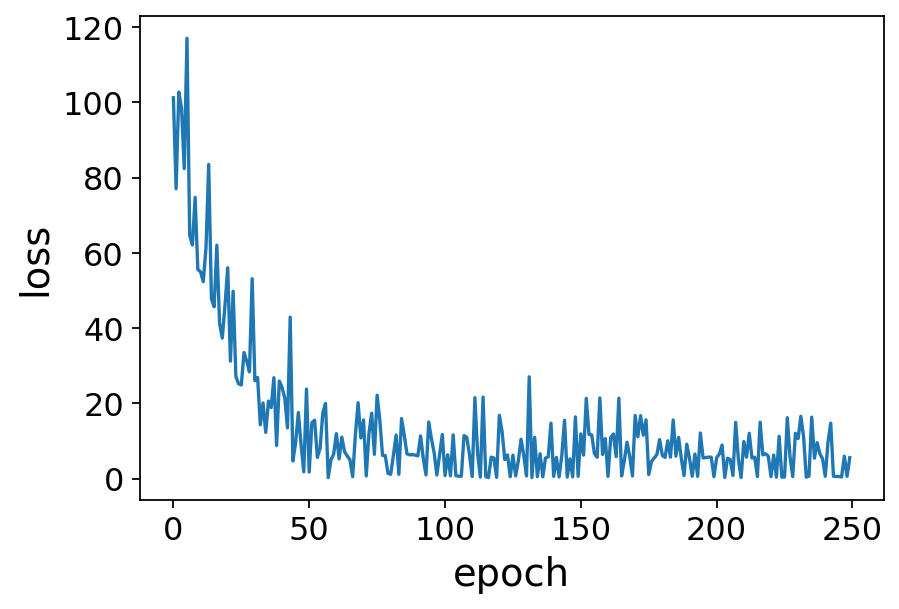

In [75]:
plt.plot(nnfitter_ssfr.loss)
plt.xlabel('epoch')
plt.ylabel('loss')

In [76]:
nnfitter_ssfr.predict_test()

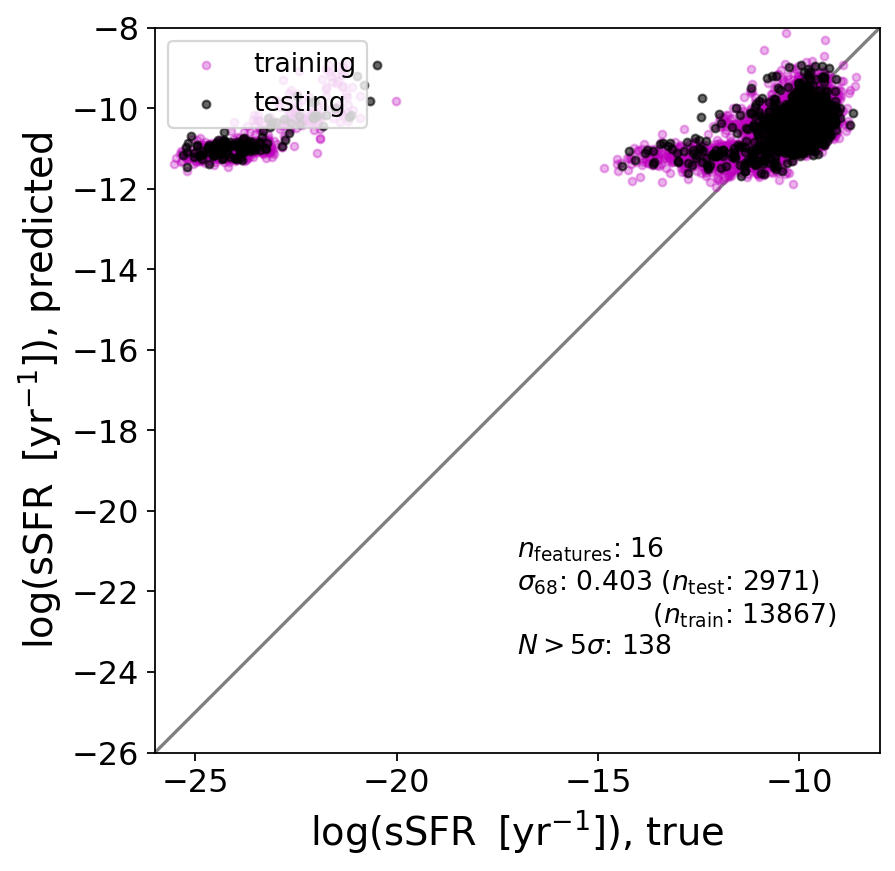

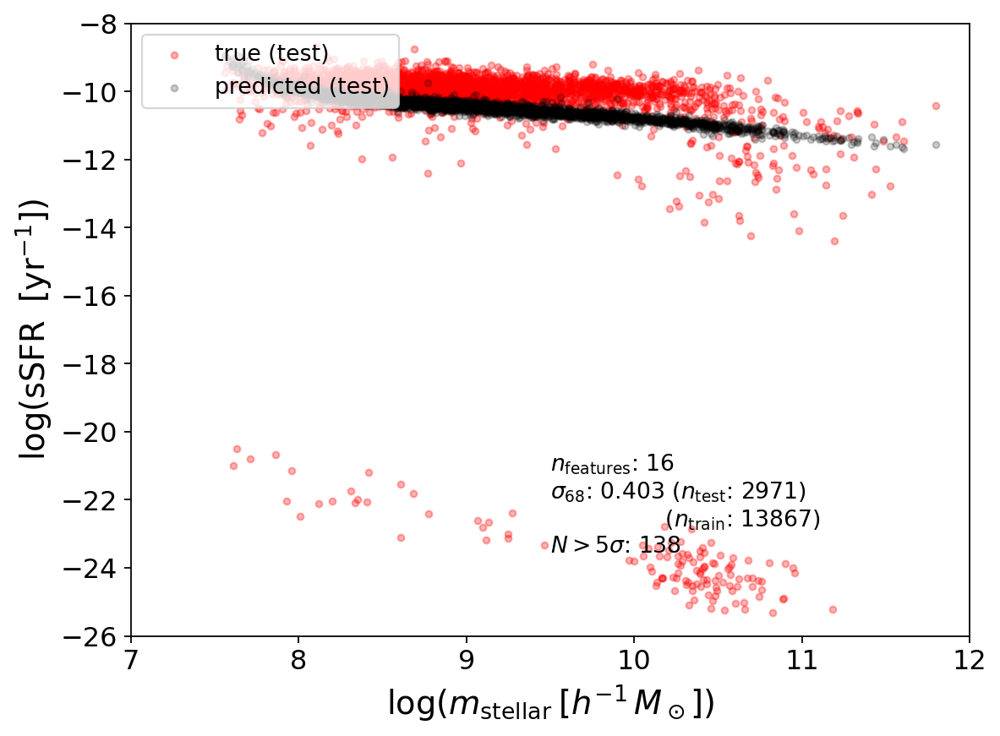

In [80]:
plotter.plot_fits(x_label_name, y_label_name, nnfitter_ssfr, log_m_stellar, x_lim=(7, 12),  y_lim=(-26, -8))

# SFR with added uncertainties

In [145]:
x_label_name = 'm_stellar'
y_label_name = 'sfr'

Units of SFR: Msun/year (note: no little h!)

In [146]:
sim_reader.add_catalog_property_to_halos('sfr_hydro_subhalo_star')
sfr_orig = np.array([dark_halo.catalog_properties['sfr_hydro_subhalo_star'] for dark_halo in sim_reader.dark_halo_arr])

In [147]:
idx_zerosfr = np.where(sfr_orig==0)[0]
idx_sfing = np.where(sfr_orig>0)[0]
print(len(sfr_orig), len(idx_zerosfr), len(idx_sfing))

19810 796 19014


In [144]:
sfr_zero = 1e-3

In [148]:
# sfr_min = np.min(sfr_orig[idx_sfing])
# print(sfr_min)

In [149]:
sfr = sfr_orig.copy()
sfr[idx_zerosfr] = sfr_zero

In [150]:
log_sfr = np.log10(sfr)

0.0 99.81936


Text(0, 0.5, 'number per bin')

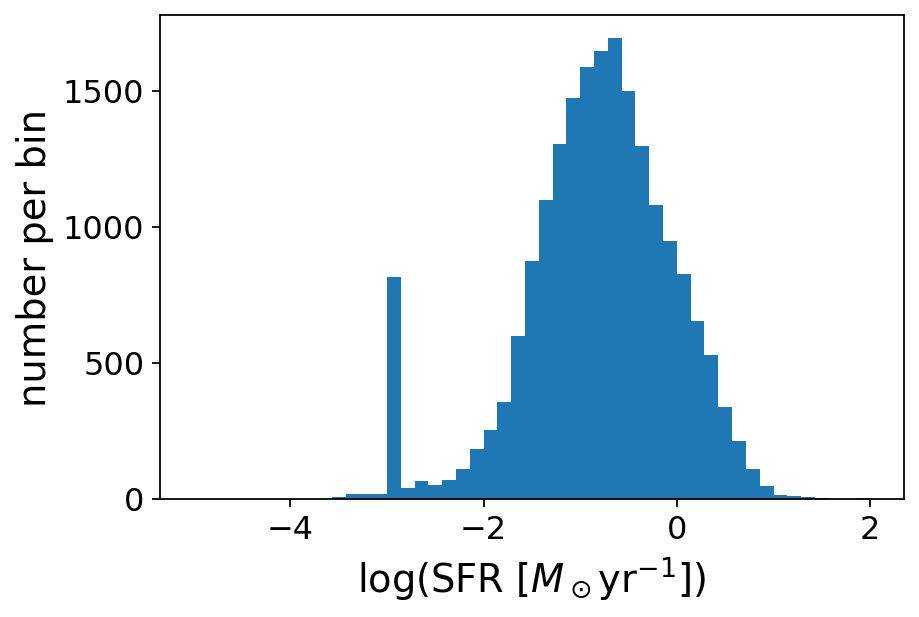

In [151]:
y_label_sfr=r'log(SFR $[M_\odot \mathrm{yr}^{-1}]$)'
print(np.min(sfr_orig), np.max(sfr))
bins = np.linspace(-5, 2)
_ = plt.hist(log_sfr, bins=bins)
plt.xlabel(y_label_sfr)
plt.ylabel('number per bin')

In [152]:
log_sfr_train = log_sfr[idx_train]

Text(0, 0.5, 'log(SFR $\\: [M_\\odot \\, \\mathrm{yr}^{-1}]$)')

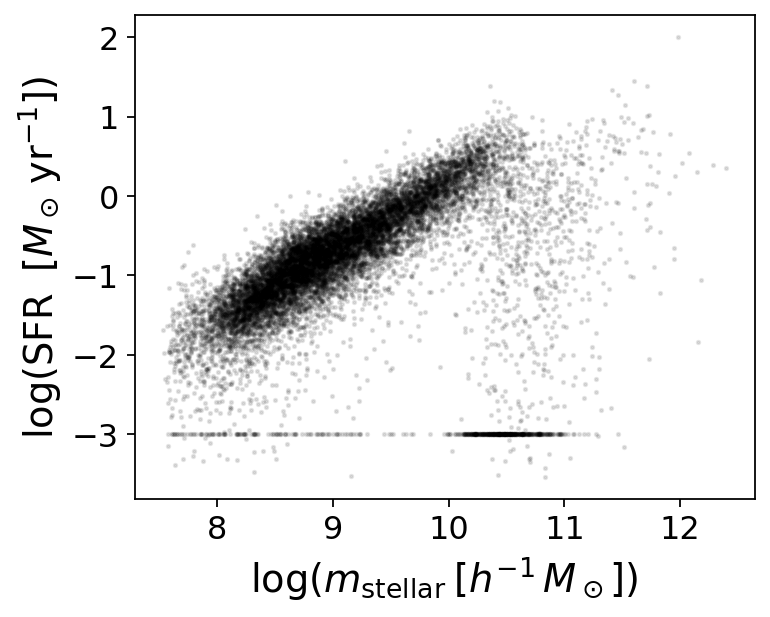

In [153]:
plt.figure(figsize=(5,4))
plt.scatter(log_m_stellar_train+log_mass_shift, log_sfr_train, s=2, c='k', alpha=0.1)
plt.xlabel(utils.label_dict[x_label_name])
plt.ylabel(utils.label_dict[y_label_name])

In [154]:
# these are uncertainties in dex so they are on log_sfr! (same deal as stellar mass)
uncertainties_genel2019_sfr = utils.get_uncertainties_genel2019('sfr', log_m_stellar+log_mass_shift, sim_name)
uncertainties_genel2019_sfr_train = uncertainties_genel2019_sfr[idx_train]

1/sqrt(N) is the fractional shot noise! which is the same as natural log, which is what hogg said last week. so just have to transform to log10 with a factor of ln(10)

In [156]:
# compute shot noise uncertainty 
N_over_zero = sfr/sfr_zero
uncertainties_poisson = 1/np.sqrt(N_over_zero)
# this maybe is in natural log space?? convert to log10 space
# sig_ln = sig_x/x
# sig_log10 = 1/ln(10) sig_x/x
# divide: sig_ln/sig_log10 = ln(10)
# so sig_log10 = sig_ln / ln(10)
uncertainties_poisson_log10 = uncertainties_poisson / np.log(10)

In [146]:
# this is in SFR space; convert to log uncertainties
# formula from here: 
# https://physics.stackexchange.com/questions/619143/error-propagation-with-log-base-10
#uncertainties_poission_log10 = 1/np.log(10) * uncertainties_poission / sfr

In [157]:
print(uncertainties_poisson.min(), uncertainties_poisson.max())
print(uncertainties_poisson_log10.min(), uncertainties_poisson_log10.max())

0.0031651377 1.8472531
0.0013746019 0.8022518


Looks ok!

In [158]:
uncertainties_genel2019_sfr.min(), uncertainties_genel2019_sfr.max()

(0.21, 0.62)

In [159]:
# add in quadrature to shy's intrinsic uncertainties
uncertainties_genel2019_sfr_poisson = np.sqrt(uncertainties_genel2019_sfr**2 + uncertainties_poisson_log10**2)

Text(0, 0.5, 'log(SFR $\\: [M_\\odot \\, \\mathrm{yr}^{-1}]$)')

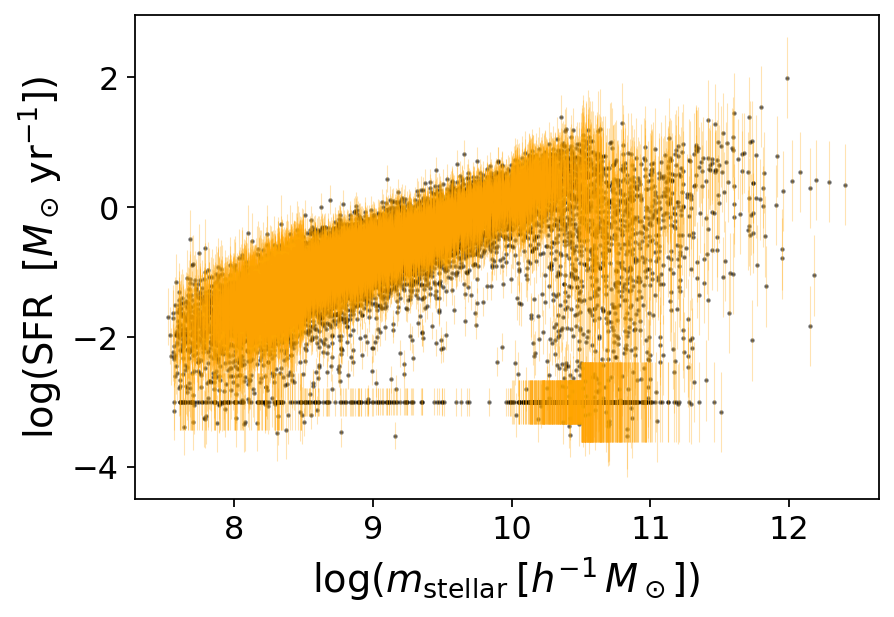

In [160]:
plt.errorbar(log_m_stellar+log_mass_shift, log_sfr, yerr=uncertainties_genel2019_sfr, color='orange', 
             lw=0, elinewidth=0.5, alpha=0.3)#, markersize=20, markerfacecolor='k')
plt.scatter(log_m_stellar+log_mass_shift, log_sfr, s=1, c='k', alpha=0.5)

plt.xlabel(utils.label_dict[x_label_name])
plt.ylabel(utils.label_dict[y_label_name])

Text(0, 0.5, 'log(SFR $\\: [M_\\odot \\, \\mathrm{yr}^{-1}]$)')

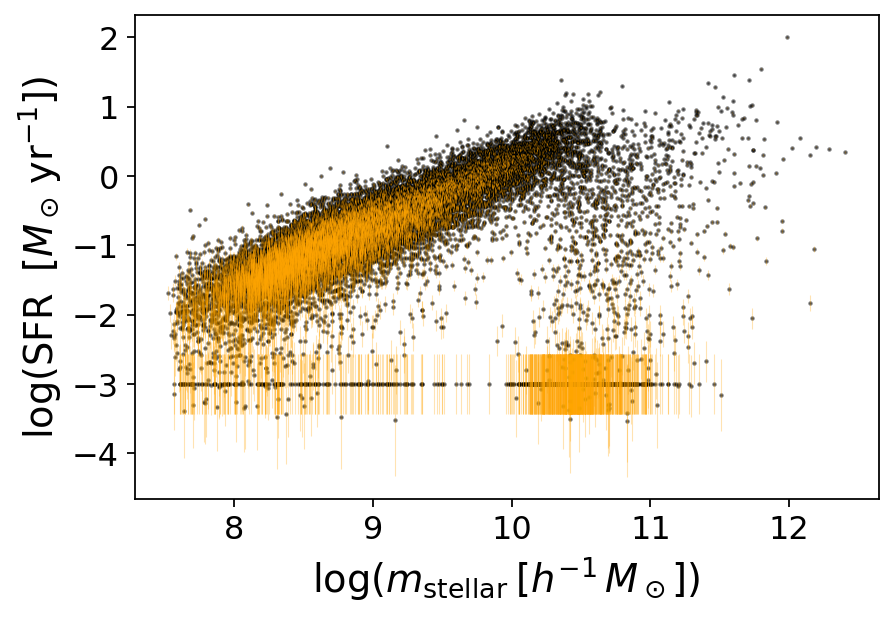

In [161]:
plt.errorbar(log_m_stellar+log_mass_shift, log_sfr, yerr=uncertainties_poisson_log10, color='orange', 
             lw=0, elinewidth=0.5, alpha=0.3)#, markersize=20, markerfacecolor='k')
plt.scatter(log_m_stellar+log_mass_shift, log_sfr, s=1, c='k', alpha=0.5)

plt.xlabel(utils.label_dict[x_label_name])
plt.ylabel(utils.label_dict[y_label_name])

combined:

Text(0, 0.5, 'log(SFR $\\: [M_\\odot \\, \\mathrm{yr}^{-1}]$)')

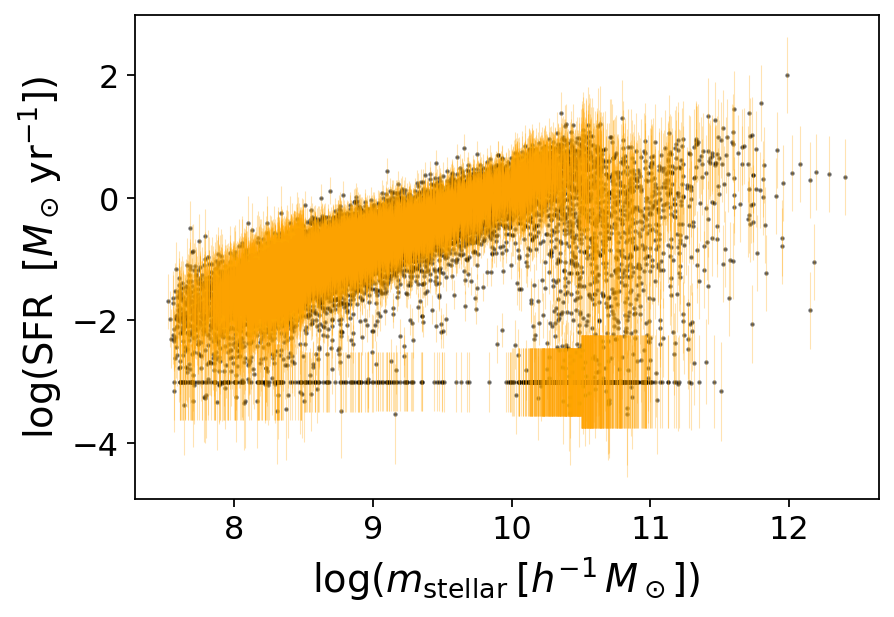

In [162]:
plt.errorbar(log_m_stellar+log_mass_shift, log_sfr, yerr=uncertainties_genel2019_sfr_poisson, color='orange', 
             lw=0, elinewidth=0.5, alpha=0.3)#, markersize=20, markerfacecolor='k')
plt.scatter(log_m_stellar+log_mass_shift, log_sfr, s=1, c='k', alpha=0.5)

plt.xlabel(utils.label_dict[x_label_name])
plt.ylabel(utils.label_dict[y_label_name])

In [163]:
sfr_train = sfr_orig[idx_train]
idx_sfing_train = np.where(sfr_train>0)[0]
print(len(sfr_train), len(idx_sfing_train))

13867 13327


In [164]:
uncertainties_genel2019_sfr_poisson_train = uncertainties_genel2019_sfr_poisson[idx_train]

In [165]:
idx_nonzerosfr = (log_sfr_train > np.log10(zerosfr_replacements))
idx_lowm = (log_m_stellar_train+log_mass_shift < 10.5)
idx_fit = idx_nonzerosfr & idx_lowm

params_initial_guess = [1,0]
y_val_current_powerlaw_fit_sfr_train_sfing, params_best_fit = utils.fit_function(
                                                        utils.power_law,
                                                        log_m_stellar_train[idx_fit], log_sfr_train[idx_fit], 
                                                        uncertainties_genel2019_sfr_poisson_train[idx_fit], 
                                                        params_initial_guess)
y_val_current_powerlaw_fit_sfr = utils.power_law(log_m_stellar, *params_best_fit)
y_val_current_powerlaw_fit_sfr_train = y_val_current_powerlaw_fit_sfr[idx_train]

print(params_best_fit)

#y_val_current_powerlaw_fit = y_val_current_powerlaw_fit_sfr/m_stellar_Msun
#y_val_current_powerlaw_fit_train = y_val_current_powerlaw_fit[idx_train]
#y_val_current_powerlaw_fit_train = y_val_current_powerlaw_fit_sfr_train/m_stellar_Msun[idx_train]

[0.79699547 0.08029981]


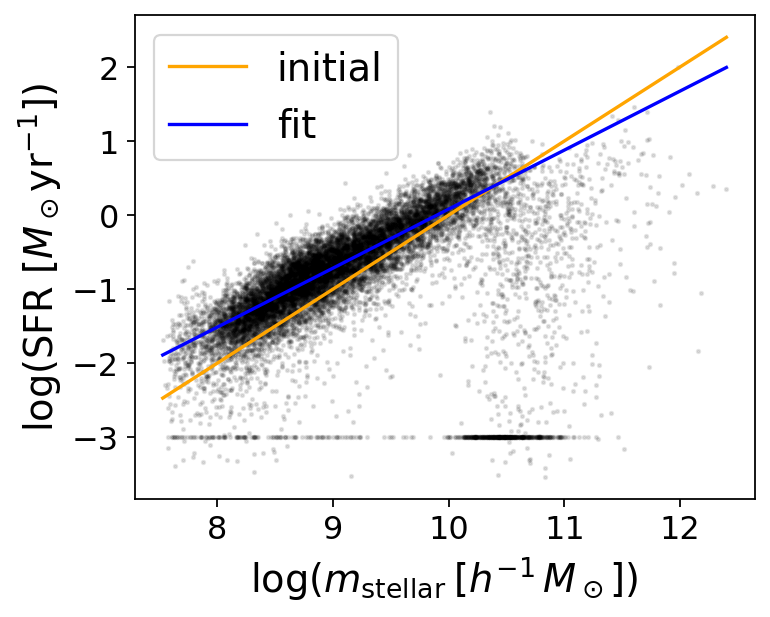

In [166]:
plt.figure(figsize=(5,4))
plt.scatter(log_m_stellar_train+log_mass_shift, log_sfr_train, s=2, c='k', alpha=0.1)

idx_mstellar = np.argsort(log_m_stellar_train)
y_initial_train = utils.power_law(log_m_stellar_train, *params_initial_guess)
plt.plot(log_m_stellar_train[idx_mstellar]+log_mass_shift, y_initial_train[idx_mstellar], color='orange', label='initial')
plt.plot(log_m_stellar_train[idx_mstellar]+log_mass_shift, y_val_current_powerlaw_fit_sfr_train[idx_mstellar], color='blue', label='fit')

plt.xlabel(utils.label_dict['m_stellar'])
plt.ylabel(y_label_sfr)
plt.legend()

0.35303175944768944


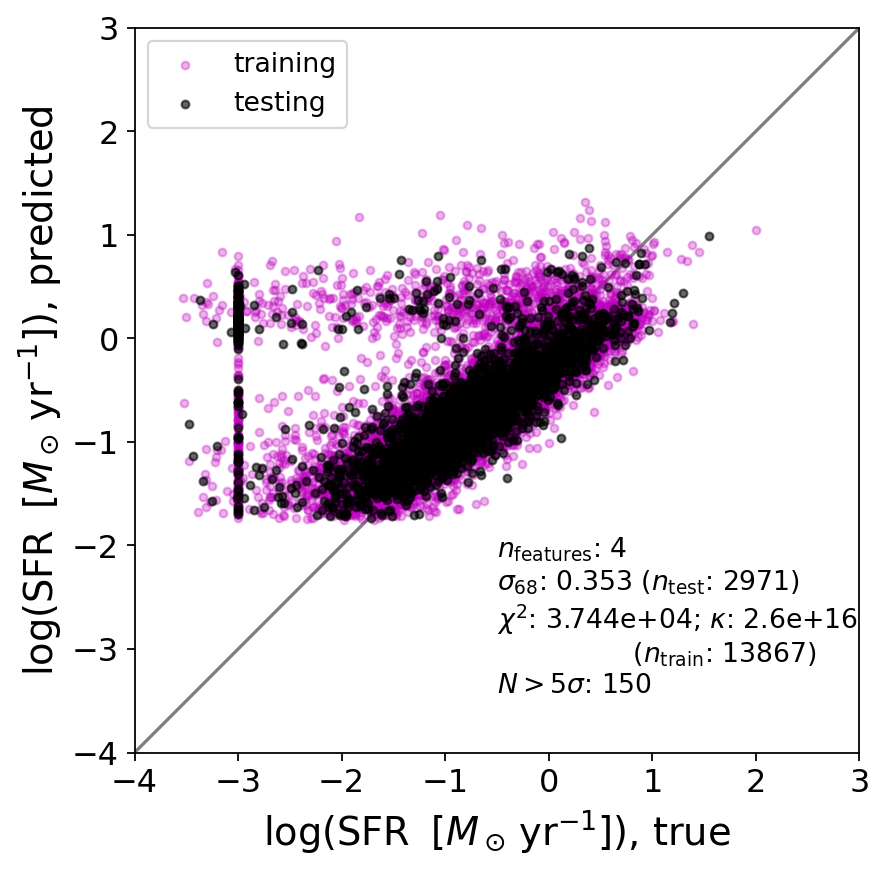

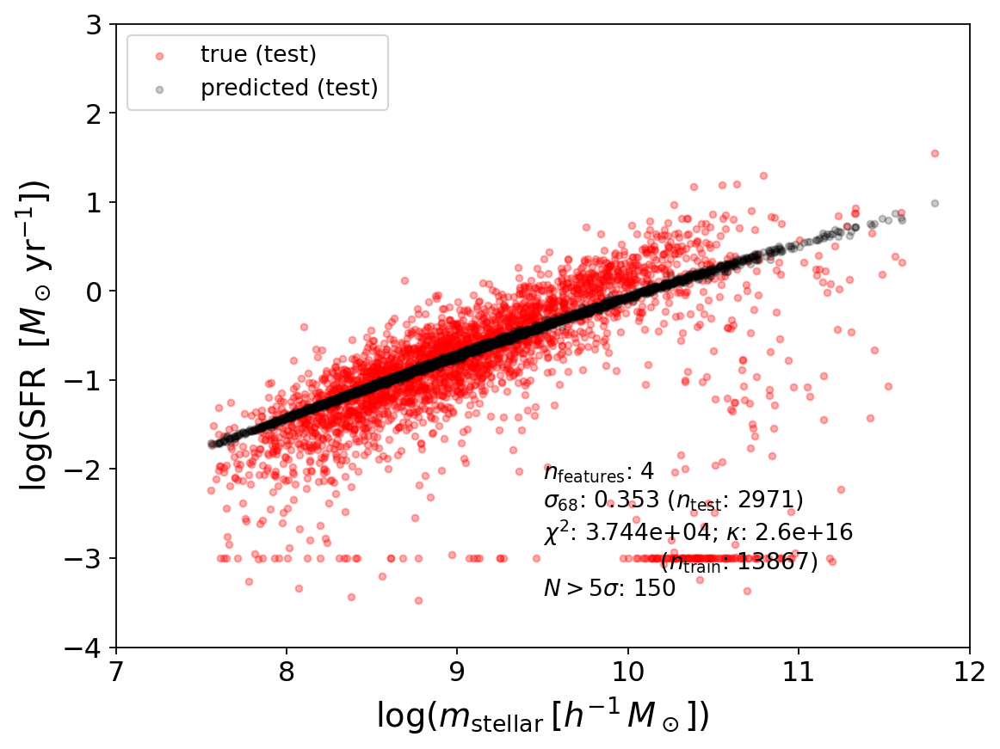

In [167]:
x_label_name = 'm_stellar'
ones_features = np.atleast_2d(np.ones(len(log_m_stellar))).T
x_extra_mtot = np.atleast_2d(np.log10(m_200m)).T
fitter_M = LinearFitter(ones_features, log_sfr, 
                    y_val_current_powerlaw_fit_sfr, uncertainties=uncertainties_genel2019_sfr_poisson,
                    x_features_extra=x_extra_mtot)
fitter_M.split_train_test(idx_train, idx_val)
fitter_M.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_M.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_M, log_m_stellar, x_lim=(7, 12),  y_lim=(-4, 3))
error_powerlawM, _ = utils.compute_error(fitter_M, test_error_type='percentile')
print(error_powerlawM)

0.3450370960113999


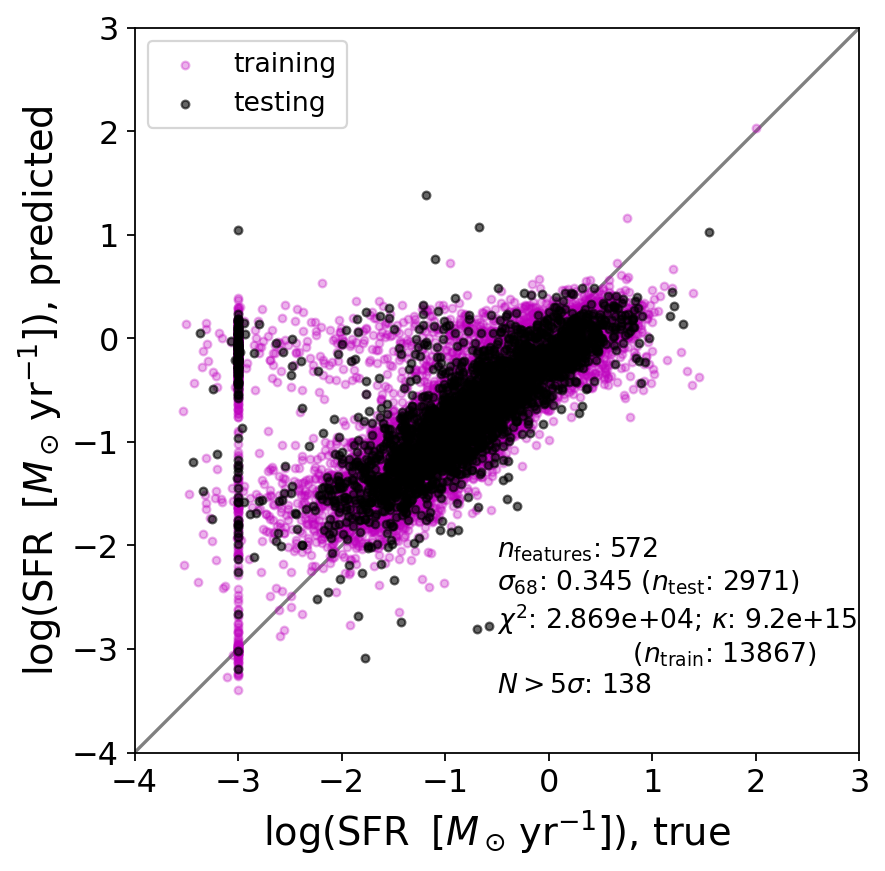

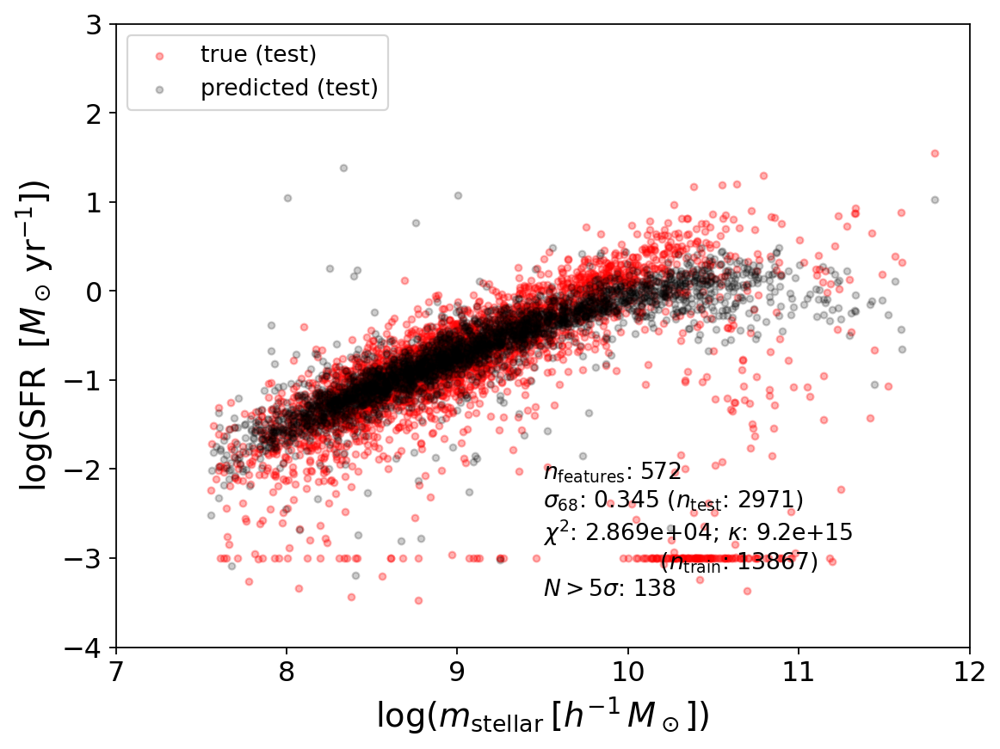

In [169]:
x_label_name = 'm_stellar'

fitter_all = LinearFitter(scalar_featurizer.scalar_features, log_sfr, 
                    y_val_current_powerlaw_fit_sfr, uncertainties=uncertainties_genel2019_sfr_poisson,
                    x_features_extra=x_features_extra)
fitter_all.split_train_test(idx_train, idx_val)
fitter_all.scale_and_fit(rms_x=True, log_x=False, log_y=False)
fitter_all.predict_test()
plotter.plot_fits(x_label_name, y_label_name, fitter_all, log_m_stellar, x_lim=(7, 12),  y_lim=(-4, 3))
error_all, _ = utils.compute_error(fitter_all, test_error_type='percentile')
print(error_all)

/home/ksf293/equivariant-cosmology/notebooks/../code/utils.py:261: UserWarning: Trying to register the cmap 'shiftedcmap' which already exists.
  plt.register_cmap(cmap=newcmap)


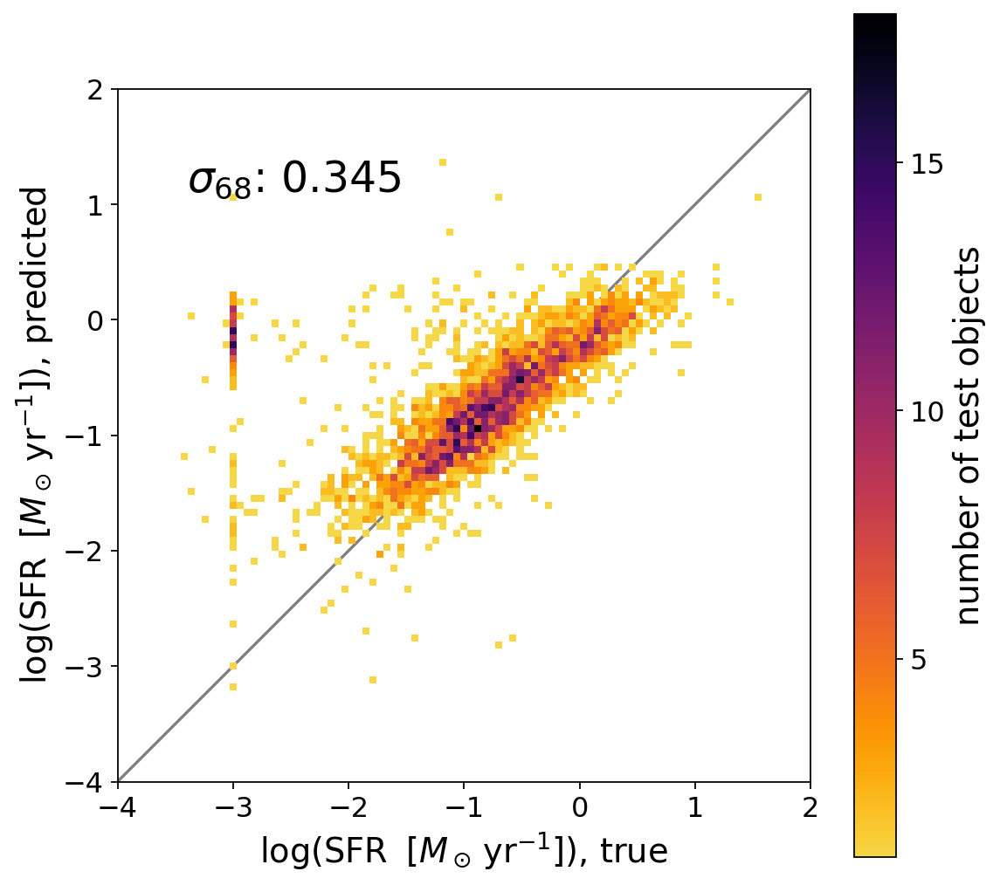

In [171]:
y_true = fitter_all.y_scalar_test
y_pred = fitter_all.y_scalar_pred
error_str = fr"$\sigma_{{68}}$: {error_all:.3f}"
plotter.plot_pred_vs_true_hist(y_label_name, y_true, y_pred, text_results=error_str,
                               x_lim=(-4, 2),  y_lim=(-4, 2))

In [201]:
scatter_lim_genel2019_sfr = 4e-1
print("Scatter from Genel fig 11:", scatter_lim_genel2019_sfr)

Scatter from Genel fig 11: 0.4


In [ ]:
# pred/true vs diff from powerlaw
# directly compare to butterfly error - if close to that, then just noise

In [174]:
y_val_current_powerlaw_fit_sfr_val = utils.power_law(log_m_stellar[idx_val], *params_best_fit)

(-5.0, 5.0)

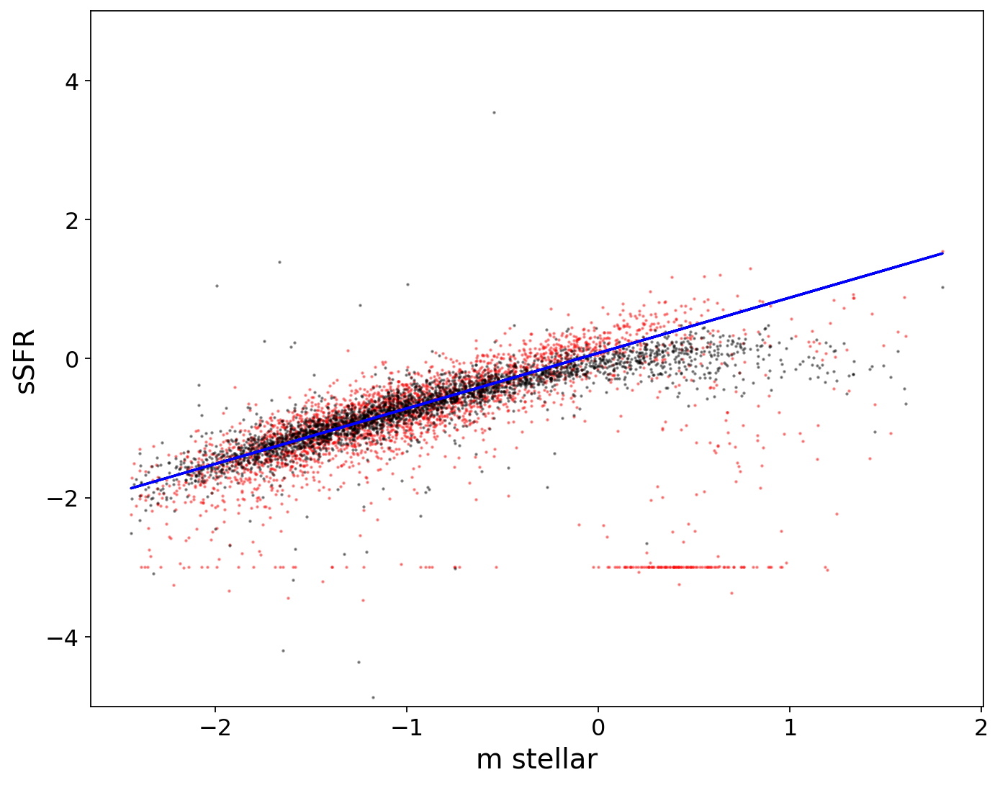

In [196]:
alpha = 0.4
plt.figure(figsize=(10,8))
plt.plot(log_m_stellar[idx_val], y_val_current_powerlaw_fit_sfr_val, color='b')
plt.scatter(log_m_stellar[idx_val], y_true, color='r', s=1, alpha=alpha, label='true')
plt.scatter(log_m_stellar[idx_val], y_pred, color='k', s=1, alpha=alpha, label='pred')
plt.xlabel('m stellar')
plt.ylabel('sSFR')
plt.ylim(-5, 5)

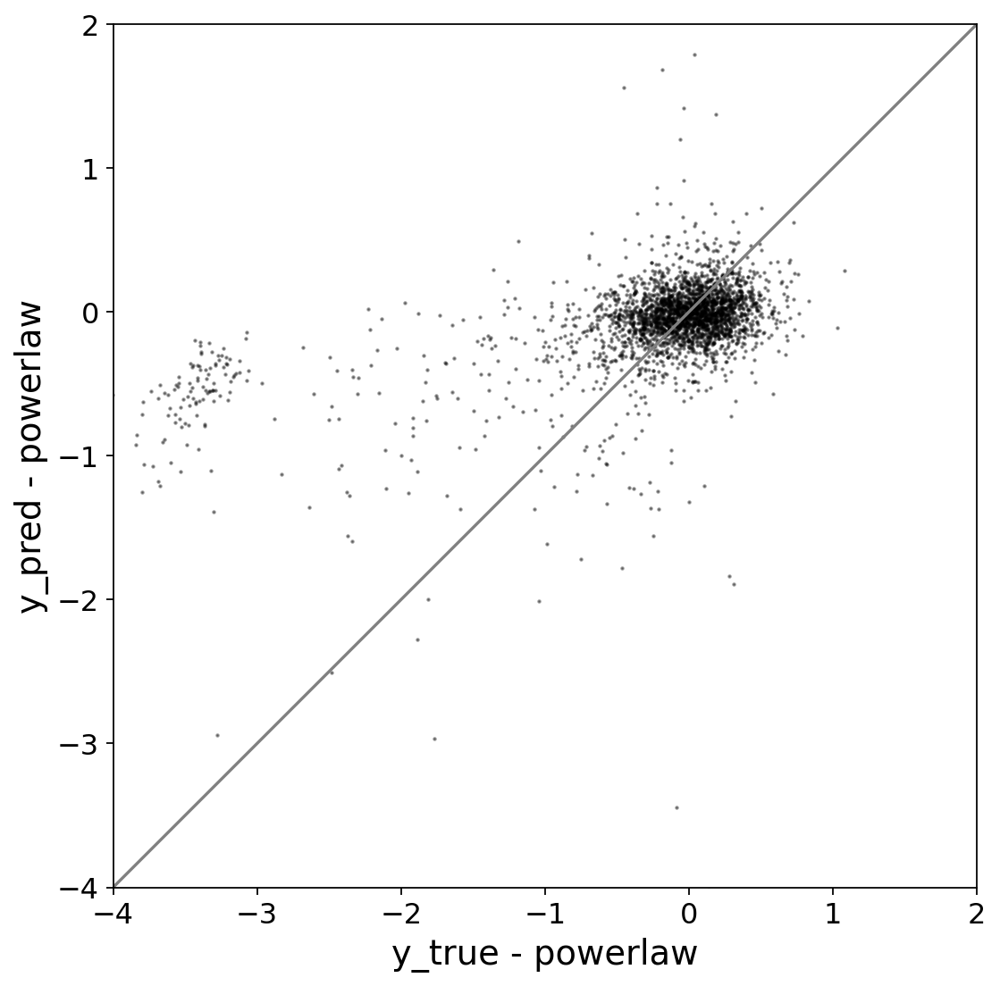

In [198]:
plt.figure(figsize=(10,8))
plt.scatter(y_true-y_val_current_powerlaw_fit_sfr_val, y_pred-y_val_current_powerlaw_fit_sfr_val, s=1, alpha=alpha, c='k')
xx = np.linspace(-4, 2)
plt.plot(xx, xx, color='grey')
plt.xlim(-4, 2)
plt.ylim(-4, 2)
plt.xlabel('y_true - powerlaw')
plt.ylabel('y_pred - powerlaw')
ax = plt.gca()
ax.set_aspect('equal')